# ***AI-Based Pyramid Convolutional Neural Network Model with ResNet and Coati Optimization for Multi-Crop, Multi-Disease Identification in Leaf Images***

# Mount Drive

In [ ]:
# prompt: mount drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


#   Install libraries

In [ ]:
!pip install split-folders

# Import libraries

In [ ]:
import keras
import tensorflow as tf


import os
import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from PIL import Image
from sklearn.preprocessing import LabelEncoder

import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.image import imread
import warnings
warnings.filterwarnings("ignore")


print("Keras version:", keras.__version__)
print("TensorFlow version:", tf.__version__)

Keras version: 3.5.0
TensorFlow version: 2.17.1


In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("alinedobrovsky/plant-disease-classification-merged-dataset")

print("Path to dataset files:", path)

100%|██████████| 17.3G/17.3G [03:19<00:00, 93.2MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/alinedobrovsky/plant-disease-classification-merged-dataset/versions/1


In [ ]:
path = "/root/.cache/kagglehub/datasets/alinedobrovsky/plant-disease-classification-merged-dataset/versions/1"

# os.listdir(path)

# Filtering

In [ ]:
import os
import shutil

# Define the dataset path and desired output path
dataset_path = "/root/.cache/kagglehub/datasets/alinedobrovsky/plant-disease-classification-merged-dataset/versions/1"

outputpath = "filtered class"

# List of desired classes
selected_classes = [
    "Corn__common_rust",
    "Corn__gray_leaf_spot",
    "Corn__healthy",
    "Corn__northern_leaf_blight",
    "Grape__black_measles",
    "Grape__black_rot",
    "Grape__healthy",
    "Grape__leaf_blight_(isariopsis_leaf_spot)",
    "Soybean__downy_mildew",
    "Soybean__healthy",
    "Soybean__mosaic_virus",
    "Soybean__powdery_mildew",
    "Soybean__rust",
    "Soybean__southern_blight",
    "Soybean__bacterial_blight"
]

# Create the output directory if it doesn't exist
os.makedirs(outputpath, exist_ok=True)

# Copy selected classes to the output directory
for class_name in selected_classes:
    class_path = os.path.join(dataset_path, class_name)
    target_path = os.path.join(outputpath, class_name)

    if os.path.exists(class_path):
        # Remove the target directory if it exists
        if os.path.exists(target_path):
            shutil.rmtree(target_path)

        # Copy the class directory
        shutil.copytree(class_path, target_path)
        print(f"Copied: {class_name}")
    else:
        print(f"Class not found: {class_name}")

print("Filtering completed!")


Copied: Corn__common_rust
Copied: Corn__gray_leaf_spot
Copied: Corn__healthy
Copied: Corn__northern_leaf_blight
Copied: Grape__black_measles
Copied: Grape__black_rot
Copied: Grape__healthy
Copied: Grape__leaf_blight_(isariopsis_leaf_spot)
Copied: Soybean__downy_mildew
Copied: Soybean__healthy
Copied: Soybean__mosaic_virus
Copied: Soybean__powdery_mildew
Copied: Soybean__rust
Copied: Soybean__southern_blight
Copied: Soybean__bacterial_blight
Filtering completed!


# Data Balancing

In [ ]:
import os
import shutil
import random

path = "filtered class"


# List of desired classes
selected_classes = [
    "Corn__common_rust",
    "Corn__gray_leaf_spot",
    "Corn__healthy",
    "Corn__northern_leaf_blight",
    "Grape__black_measles",
    "Grape__black_rot",
    "Grape__healthy",
    "Grape__leaf_blight_(isariopsis_leaf_spot)",
    "Soybean__downy_mildew",
    "Soybean__healthy",
    "Soybean__mosaic_virus",
    "Soybean__powdery_mildew",
    "Soybean__rust",
    "Soybean__southern_blight",
    "Soybean__bacterial_blight"
]

# Target range for balancing
min_files = 1000
max_files = 1100

# Initialize total file counter
total_files_in_range = 0

try:
    # Step 1: Verify the dataset structure
    print("Verifying dataset structure...")
    all_folders = [d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))]
    print(f"Top-level folders in dataset: {all_folders}")

    # Match classes with existing folders
    existing_classes = [cls for cls in selected_classes if cls in all_folders]
    missing_classes = [cls for cls in selected_classes if cls not in all_folders]

    print("\nMatching classes:")
    print(f"Existing classes: {existing_classes}")
    print(f"Missing classes: {missing_classes}")

    # Step 2: Balancing (Oversampling or Undersampling) for existing classes
    print("\nBalancing files for selected classifications:")
    for classification in existing_classes:
        class_path = os.path.join(path, classification)

        # Get all files in the class directory
        files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
        num_files = len(files)

        if num_files < min_files:
            # Oversampling: Duplicate files to reach at least min_files
            print(f"Class '{classification}' has {num_files} files. Oversampling to at least {min_files} files.")

            while num_files < min_files:
                # Randomly select a file to duplicate
                file_to_duplicate = random.choice(files)
                src = os.path.join(class_path, file_to_duplicate)
                # Generate a new file name
                new_file_name = f"copy_{num_files}_{file_to_duplicate}"
                dst = os.path.join(class_path, new_file_name)
                # Copy the file
                shutil.copy(src, dst)
                files.append(new_file_name)  # Add the new file to the list
                num_files += 1

            print(f"Class '{classification}' now has {num_files} files after oversampling.")

        elif num_files > max_files:
            # Undersampling: Remove files to reach at most max_files
            print(f"Class '{classification}' has {num_files} files. Undersampling to at most {max_files} files.")

            # Randomly shuffle the file list and remove excess files
            random.shuffle(files)
            files_to_remove = files[max_files:]
            for file in files_to_remove:
                file_path = os.path.join(class_path, file)
                os.remove(file_path)
                num_files -= 1

            print(f"Class '{classification}' now has {num_files} files after undersampling.")

        else:
            # Already balanced
            print(f"Class '{classification}' has {num_files} files. Within target range, no balancing needed.")

        # Update total file count in range
        if min_files <= num_files <= max_files:
            total_files_in_range += num_files

    # Step 3: Display total file count in range
    print(f"\nTotal number of files across all selected classes within the range [{min_files}, {max_files}]: {total_files_in_range}")

except FileNotFoundError:
    print("Error: The specified path does not exist. Please verify the path.")
except PermissionError:
    print("Error: Permission denied. Ensure you have access to the directory.")
except Exception as e:
    print(f"An error occurred: {e}")


Verifying dataset structure...
Top-level folders in dataset: ['Corn__common_rust', 'Soybean__healthy', 'Soybean__mosaic_virus', 'Soybean__bacterial_blight', 'Corn__gray_leaf_spot', 'Grape__leaf_blight_(isariopsis_leaf_spot)', 'Corn__healthy', 'Soybean__southern_blight', 'Grape__black_rot', 'Soybean__downy_mildew', 'Corn__northern_leaf_blight', 'Grape__healthy', 'Grape__black_measles', 'Soybean__rust', 'Soybean__powdery_mildew']

Matching classes:
Existing classes: ['Corn__common_rust', 'Corn__gray_leaf_spot', 'Corn__healthy', 'Corn__northern_leaf_blight', 'Grape__black_measles', 'Grape__black_rot', 'Grape__healthy', 'Grape__leaf_blight_(isariopsis_leaf_spot)', 'Soybean__downy_mildew', 'Soybean__healthy', 'Soybean__mosaic_virus', 'Soybean__powdery_mildew', 'Soybean__rust', 'Soybean__southern_blight', 'Soybean__bacterial_blight']
Missing classes: []

Balancing files for selected classifications:
Class 'Corn__common_rust' has 1308 files. Undersampling to at most 1100 files.
Class 'Corn__c

In [ ]:
import os

def get_dir_size(base_dir):
    total_size = 0
    for dirpath, dirnames, filenames in os.walk(base_dir):
        for filename in filenames:
            file_path = os.path.join(dirpath, filename)
            total_size += os.path.getsize(file_path)
    return total_size

def print_dir_structure_with_lines(base_dir, prefix="", total_size=0):
    if os.path.exists(base_dir) and os.path.isdir(base_dir):
        entries = os.listdir(base_dir)
        dirs = [entry for entry in entries if os.path.isdir(os.path.join(base_dir, entry))]
        files = [entry for entry in entries if os.path.isfile(os.path.join(base_dir, entry))]

        # Print the current directory and file count
        print(f"{prefix}📁 {os.path.basename(base_dir)} (Files: {len(files)})")

        # Loop through subdirectories
        for i, dir_name in enumerate(dirs):
            new_prefix = prefix + ("├── " if i < len(dirs) - 1 else "└── ")
            sub_dir_path = os.path.join(base_dir, dir_name)
            print_dir_structure_with_lines(sub_dir_path, prefix=new_prefix, total_size=total_size)

        # Compute and display the size of the folder and all its contents
        folder_size = get_dir_size(base_dir)
        total_size += folder_size

    else:
        print(f"The directory '{base_dir}' does not exist.")

    # Print the total size at the end of the process
    if prefix == "":
        print(f"\nTotal size of '{base_dir}': {total_size / (1024 ** 2):.2f} MB")

# Specify your folder path
folder_path = "/content/filtered class"
print_dir_structure_with_lines(folder_path)


📁 filtered class (Files: 0)
├── 📁 Corn__common_rust (Files: 1100)
├── 📁 Soybean__healthy (Files: 1100)
├── 📁 Soybean__mosaic_virus (Files: 1000)
├── 📁 Soybean__bacterial_blight (Files: 1000)
├── 📁 Corn__gray_leaf_spot (Files: 1094)
├── 📁 Grape__leaf_blight_(isariopsis_leaf_spot) (Files: 1000)
├── 📁 Corn__healthy (Files: 1100)
├── 📁 Soybean__southern_blight (Files: 1000)
├── 📁 Grape__black_rot (Files: 1100)
├── 📁 Soybean__downy_mildew (Files: 1000)
├── 📁 Corn__northern_leaf_blight (Files: 1100)
├── 📁 Grape__healthy (Files: 1000)
├── 📁 Grape__black_measles (Files: 1100)
├── 📁 Soybean__rust (Files: 1000)
└── 📁 Soybean__powdery_mildew (Files: 1000)

Total size of '/content/filtered class': 16630.61 MB


# Preprocessing

Processing class 'Corn__common_rust'...


Processing Corn__common_rust: 100%|██████████| 1100/1100 [00:02<00:00, 372.35it/s]


Displaying before-and-after images for class 'Corn__common_rust'...


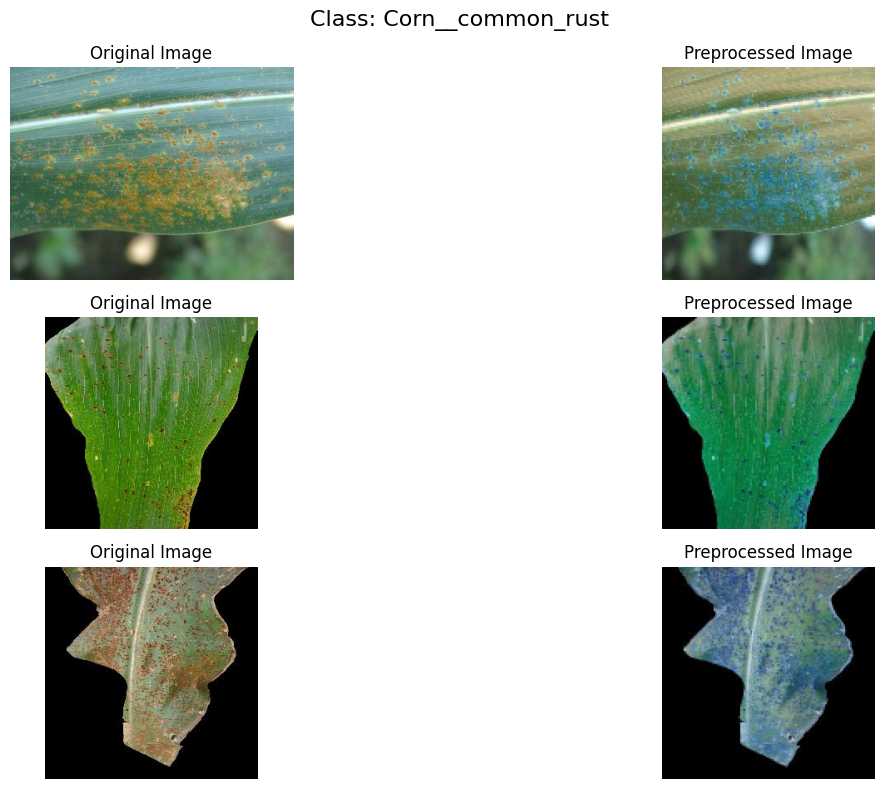

Completed processing class 'Corn__common_rust'.
Processing class 'Corn__gray_leaf_spot'...


Processing Corn__gray_leaf_spot: 100%|██████████| 1094/1094 [00:02<00:00, 500.15it/s]


Displaying before-and-after images for class 'Corn__gray_leaf_spot'...


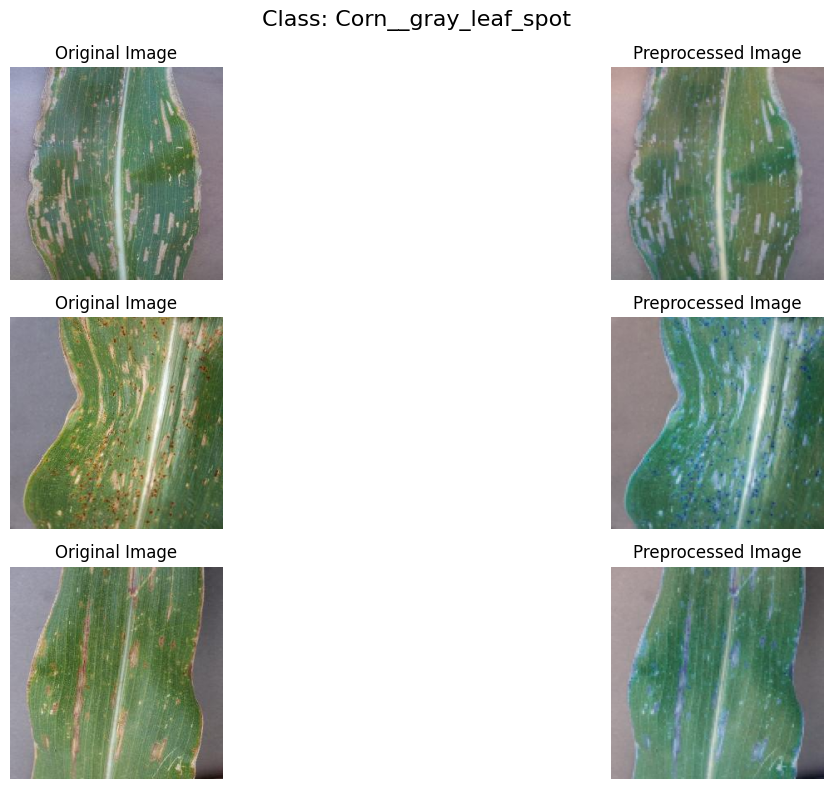

Completed processing class 'Corn__gray_leaf_spot'.
Processing class 'Corn__healthy'...


Processing Corn__healthy: 100%|██████████| 1100/1100 [00:01<00:00, 807.06it/s]


Displaying before-and-after images for class 'Corn__healthy'...


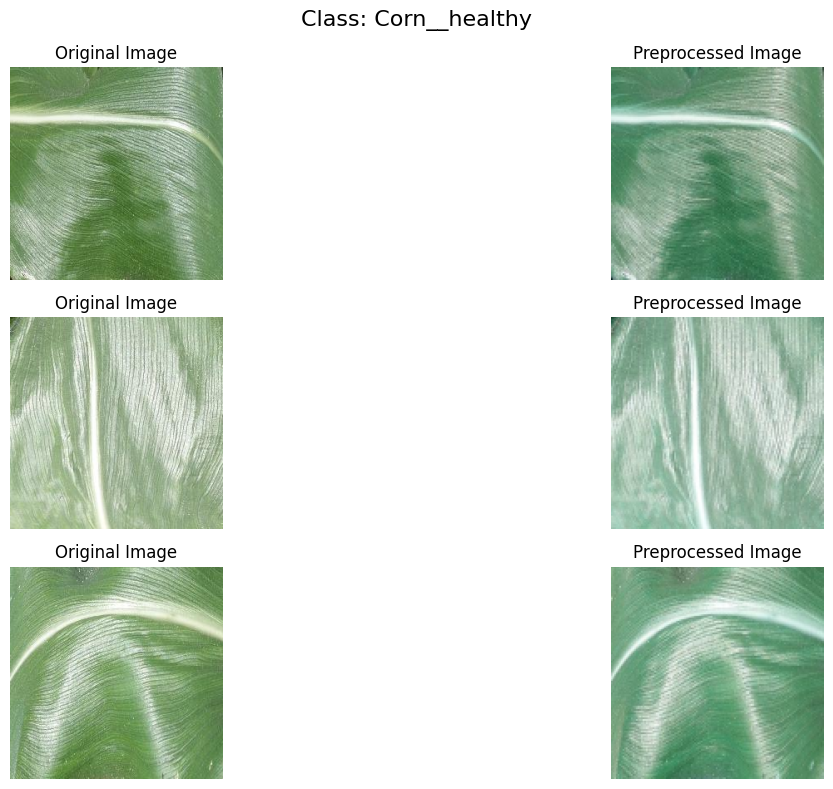

Completed processing class 'Corn__healthy'.
Processing class 'Corn__northern_leaf_blight'...


Processing Corn__northern_leaf_blight: 100%|██████████| 1100/1100 [00:09<00:00, 115.14it/s]


Displaying before-and-after images for class 'Corn__northern_leaf_blight'...


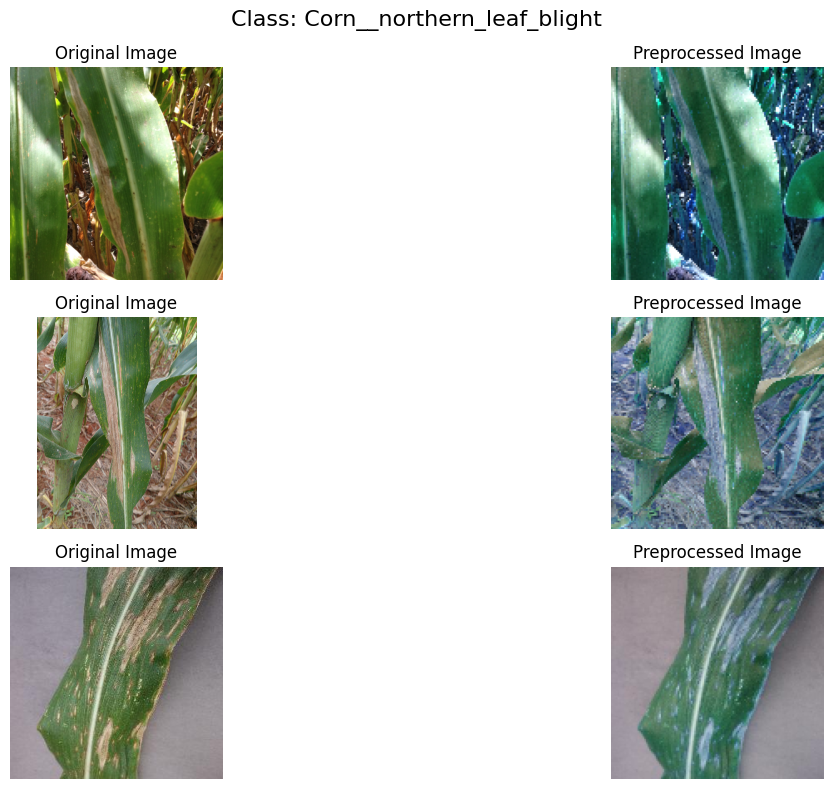

Completed processing class 'Corn__northern_leaf_blight'.
Processing class 'Grape__black_measles'...


Processing Grape__black_measles: 100%|██████████| 1100/1100 [00:01<00:00, 600.27it/s]


Displaying before-and-after images for class 'Grape__black_measles'...


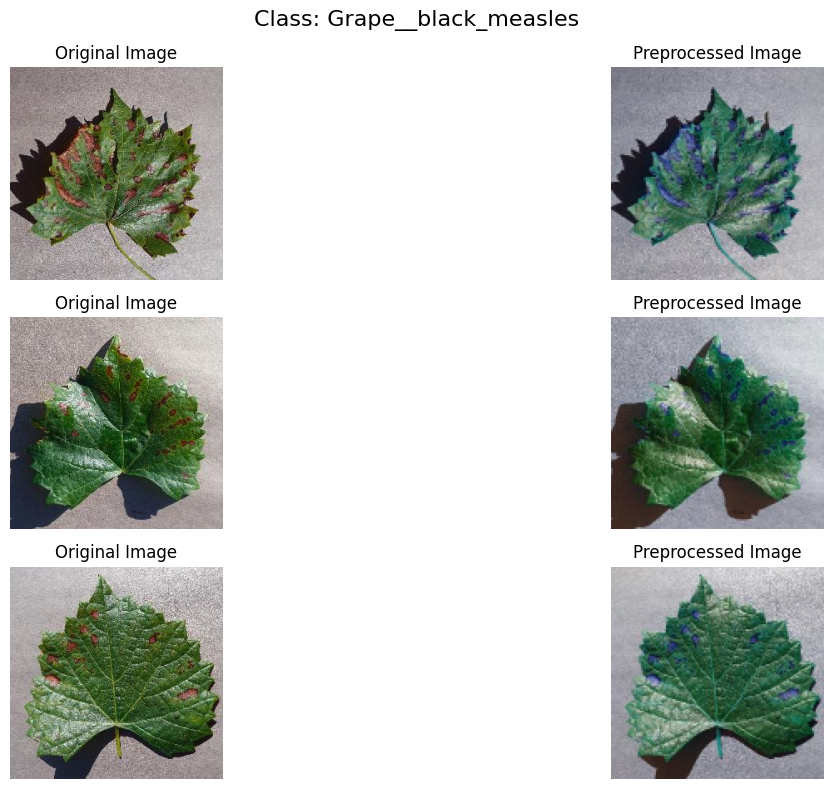

Completed processing class 'Grape__black_measles'.
Processing class 'Grape__black_rot'...


Processing Grape__black_rot: 100%|██████████| 1100/1100 [00:02<00:00, 372.08it/s]


Displaying before-and-after images for class 'Grape__black_rot'...


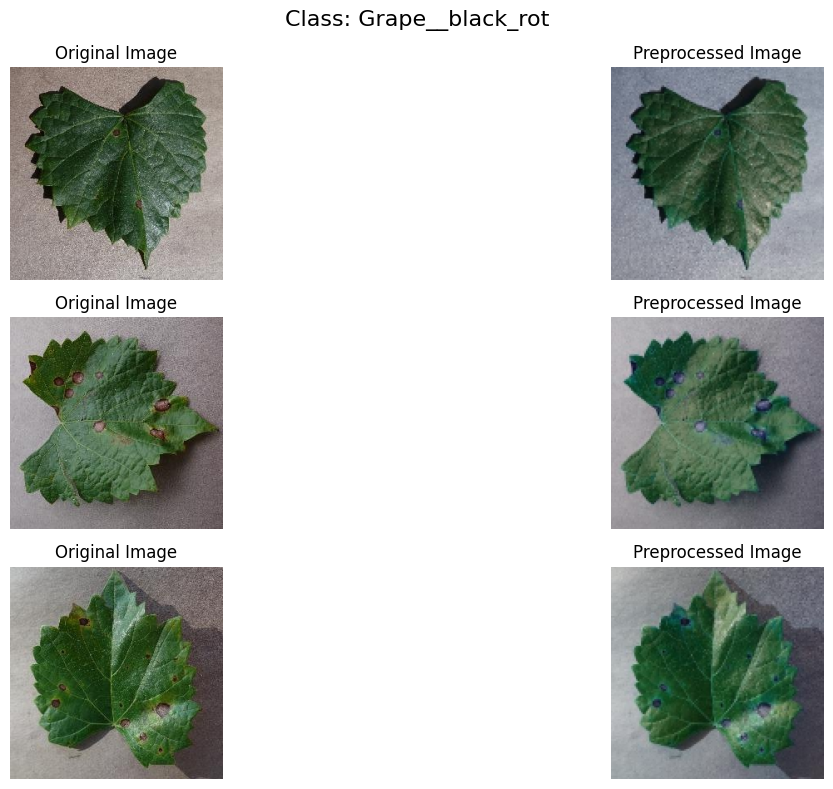

Completed processing class 'Grape__black_rot'.
Processing class 'Grape__healthy'...


Processing Grape__healthy: 100%|██████████| 1000/1000 [00:04<00:00, 206.43it/s]


Displaying before-and-after images for class 'Grape__healthy'...


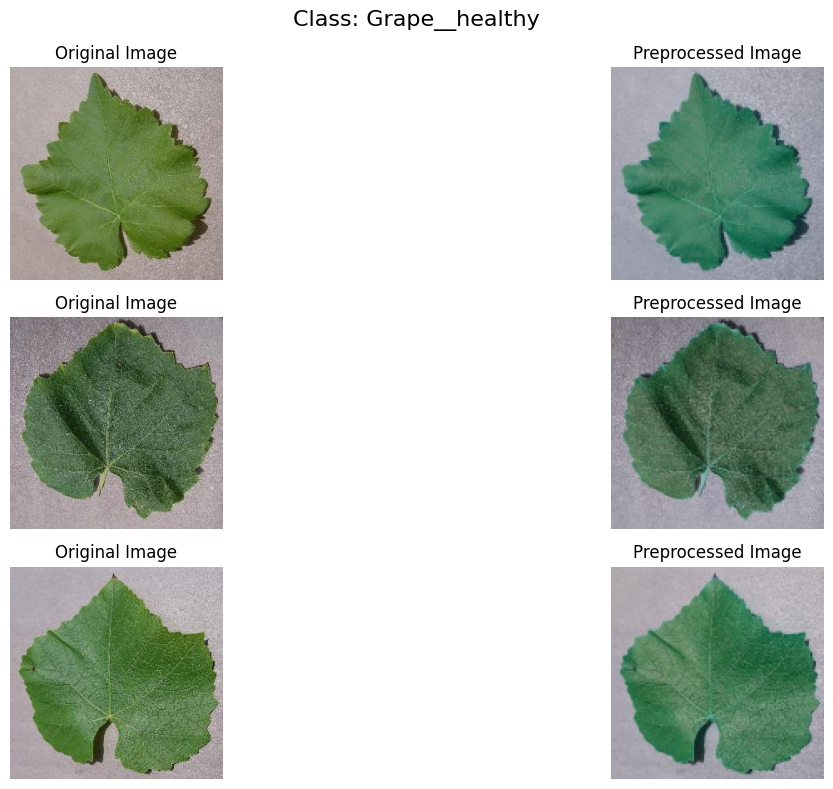

Completed processing class 'Grape__healthy'.
Processing class 'Grape__leaf_blight_(isariopsis_leaf_spot)'...


Processing Grape__leaf_blight_(isariopsis_leaf_spot): 100%|██████████| 1000/1000 [00:01<00:00, 719.16it/s]


Displaying before-and-after images for class 'Grape__leaf_blight_(isariopsis_leaf_spot)'...


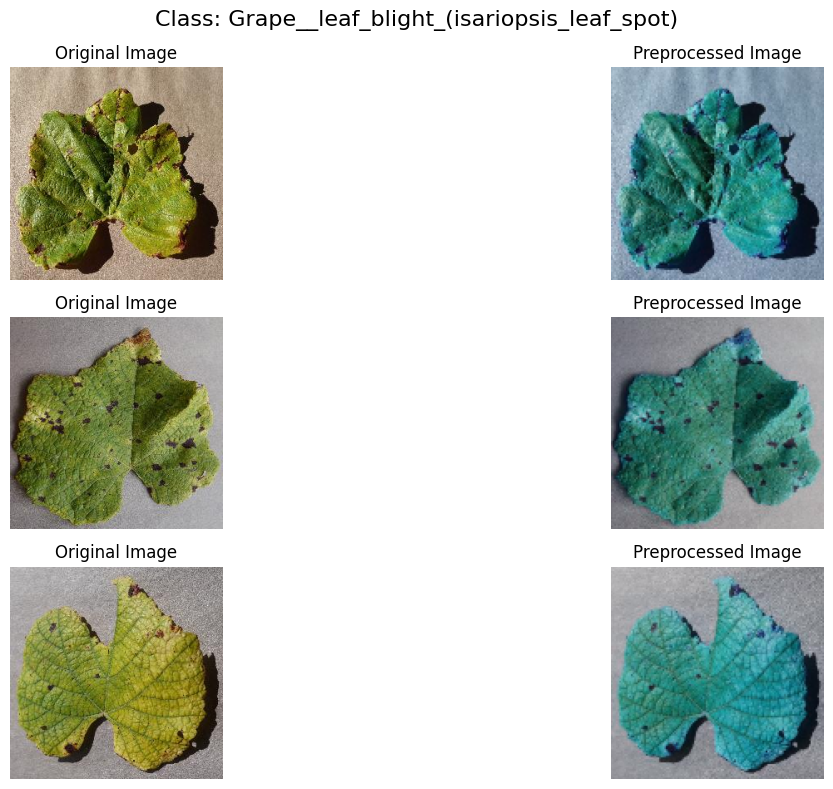

Completed processing class 'Grape__leaf_blight_(isariopsis_leaf_spot)'.
Processing class 'Soybean__downy_mildew'...


Processing Soybean__downy_mildew: 100%|██████████| 1000/1000 [01:49<00:00,  9.09it/s]


Displaying before-and-after images for class 'Soybean__downy_mildew'...


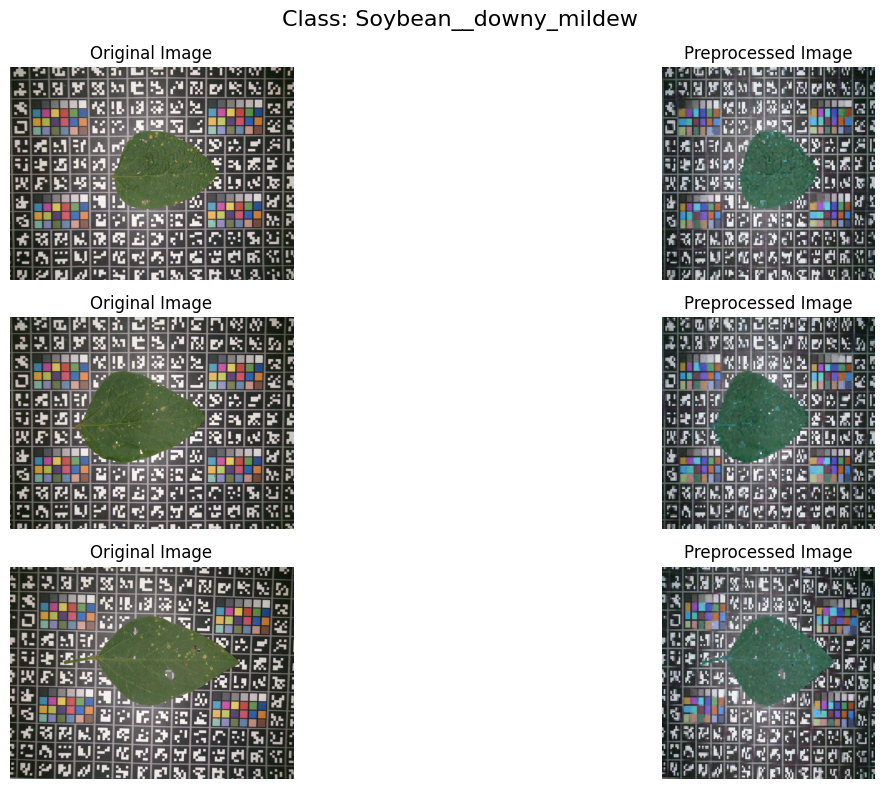

Completed processing class 'Soybean__downy_mildew'.
Processing class 'Soybean__healthy'...


Processing Soybean__healthy: 100%|██████████| 1100/1100 [00:03<00:00, 300.48it/s]


Displaying before-and-after images for class 'Soybean__healthy'...


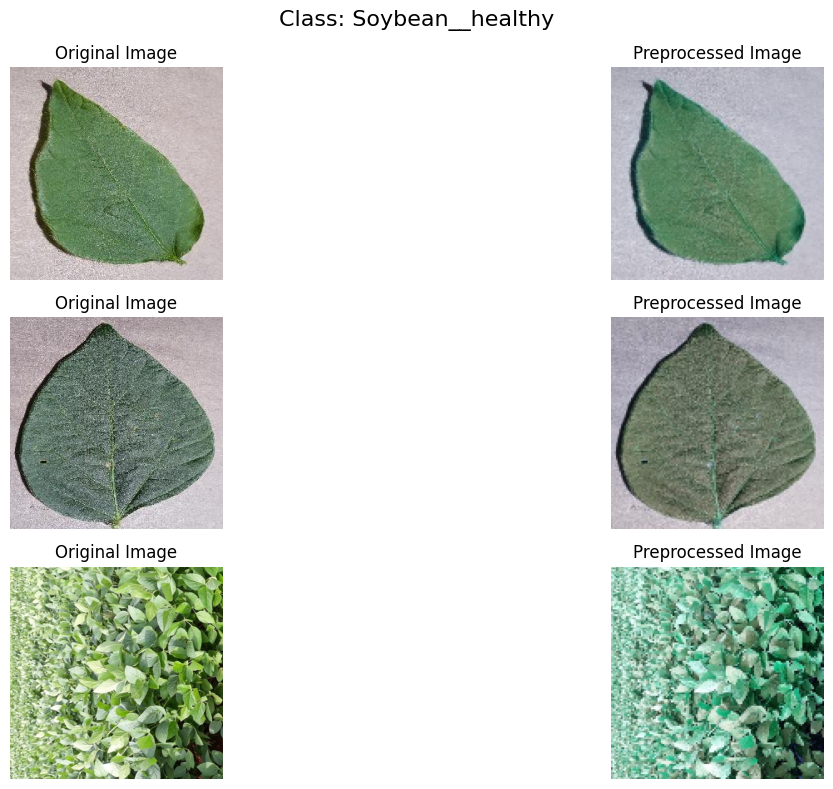

Completed processing class 'Soybean__healthy'.
Processing class 'Soybean__mosaic_virus'...


Processing Soybean__mosaic_virus: 100%|██████████| 1000/1000 [02:40<00:00,  6.24it/s]


Displaying before-and-after images for class 'Soybean__mosaic_virus'...


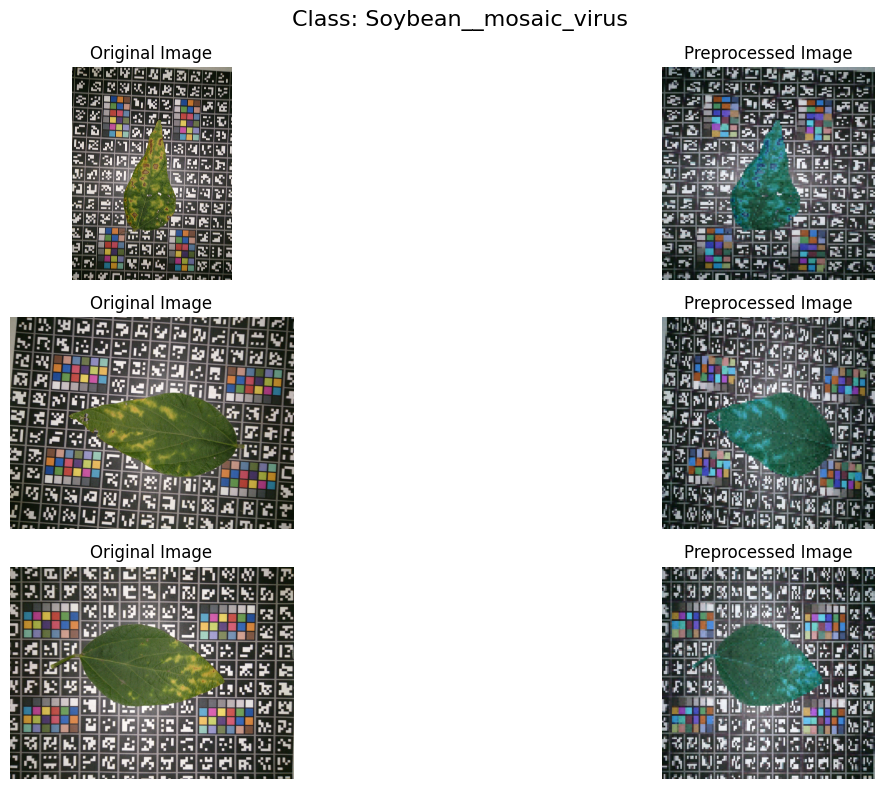

Completed processing class 'Soybean__mosaic_virus'.
Processing class 'Soybean__powdery_mildew'...


Processing Soybean__powdery_mildew: 100%|██████████| 1000/1000 [03:03<00:00,  5.45it/s]


Displaying before-and-after images for class 'Soybean__powdery_mildew'...


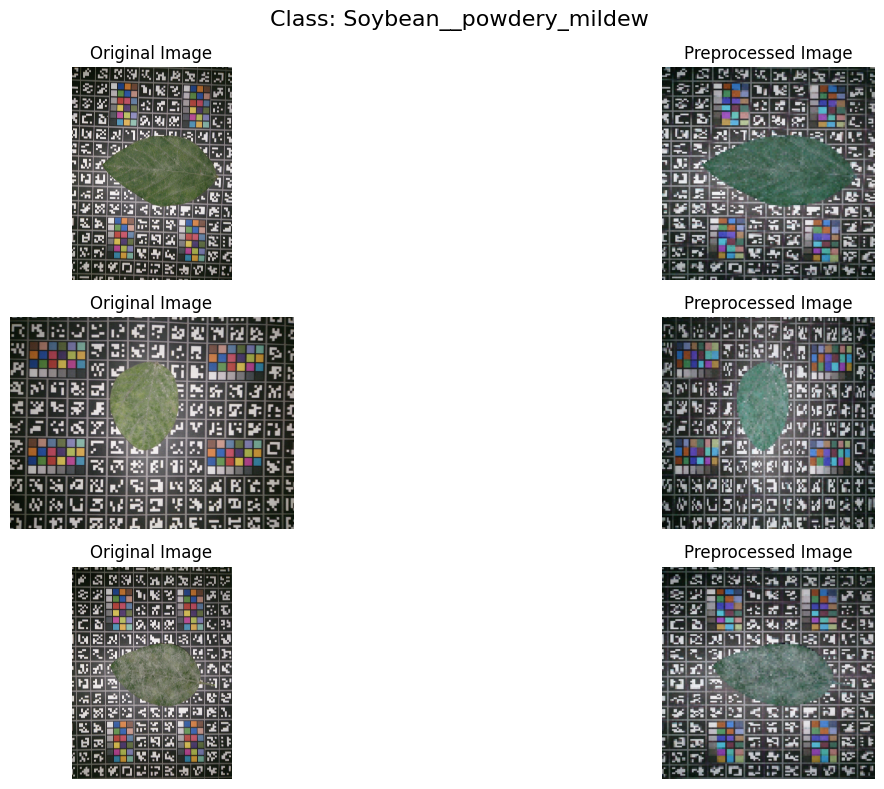

Completed processing class 'Soybean__powdery_mildew'.
Processing class 'Soybean__rust'...


Processing Soybean__rust: 100%|██████████| 1000/1000 [03:06<00:00,  5.37it/s]


Displaying before-and-after images for class 'Soybean__rust'...


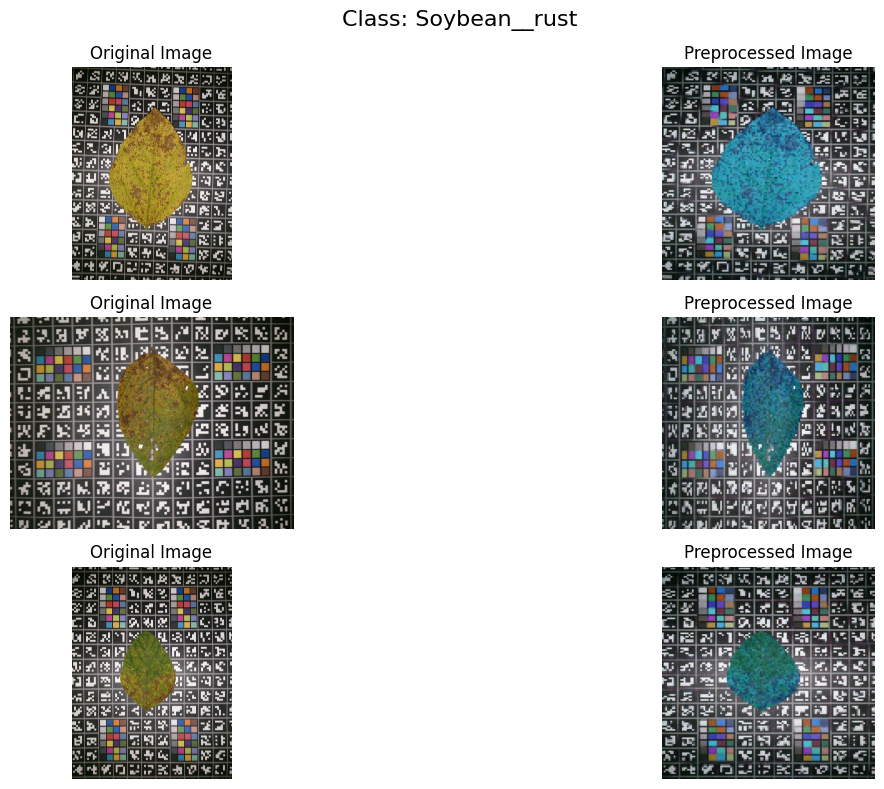

Completed processing class 'Soybean__rust'.
Processing class 'Soybean__southern_blight'...


Processing Soybean__southern_blight: 100%|██████████| 1000/1000 [03:04<00:00,  5.42it/s]


Displaying before-and-after images for class 'Soybean__southern_blight'...


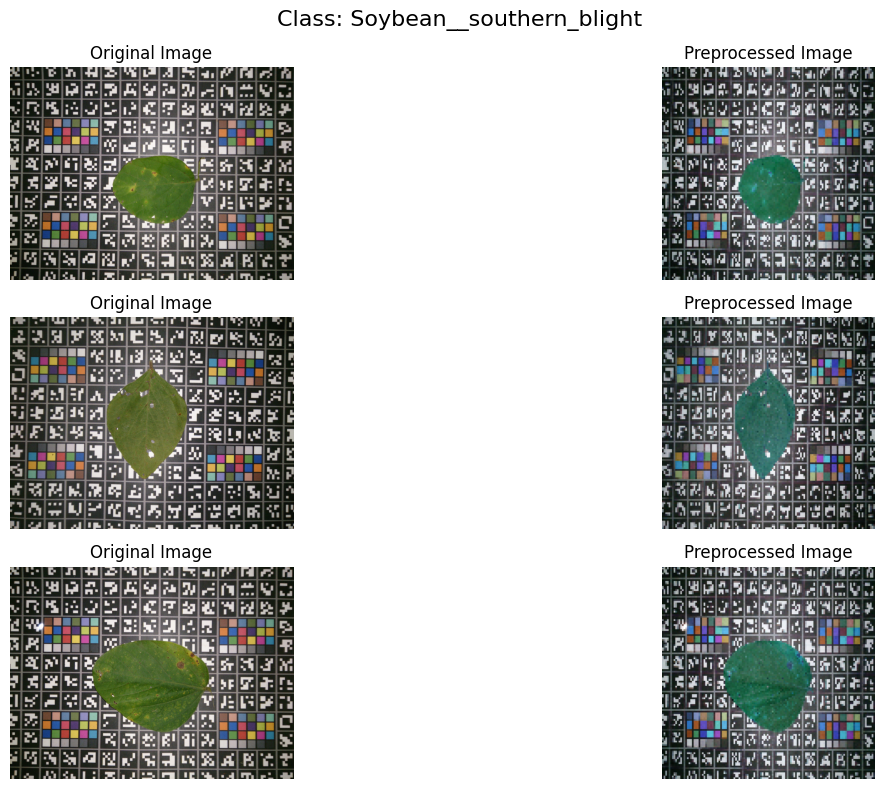

Completed processing class 'Soybean__southern_blight'.
Processing class 'Soybean__bacterial_blight'...


Processing Soybean__bacterial_blight: 100%|██████████| 1000/1000 [02:30<00:00,  6.66it/s]


Displaying before-and-after images for class 'Soybean__bacterial_blight'...


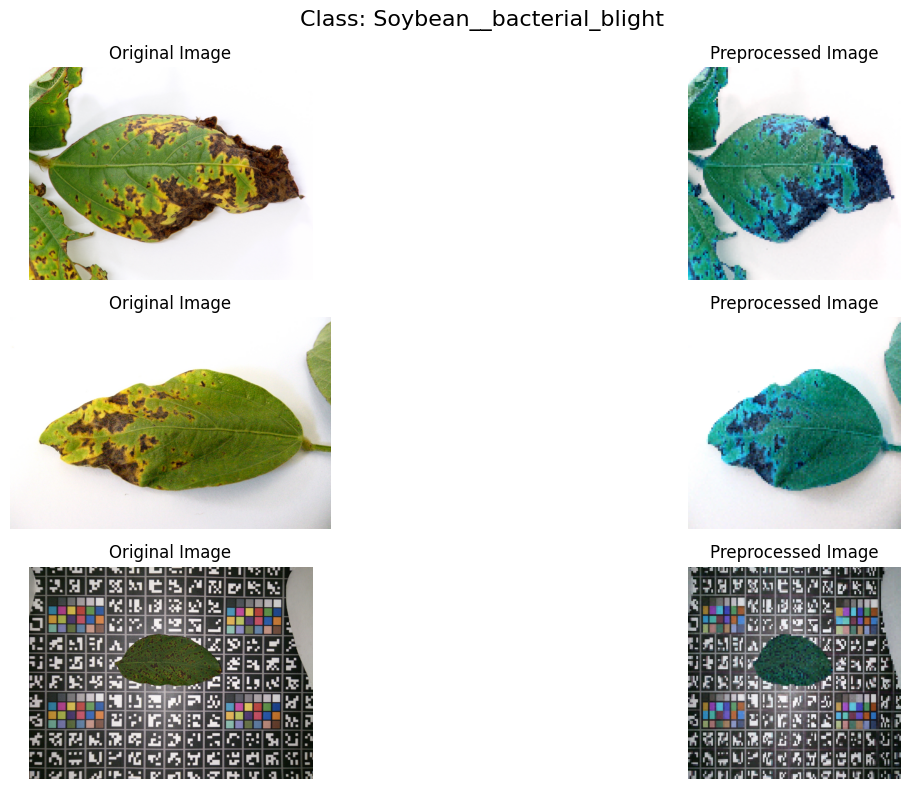

Completed processing class 'Soybean__bacterial_blight'.

Preprocessing and visualization completed for all selected classes.


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm


dataset_path = "filtered class"

# Path to save preprocessed data
preprocessed_data_path = "preprocessed_dataset"

# List of selected classes
selected_classes = [
    "Corn__common_rust",
    "Corn__gray_leaf_spot",
    "Corn__healthy",
    "Corn__northern_leaf_blight",
    "Grape__black_measles",
    "Grape__black_rot",
    "Grape__healthy",
    "Grape__leaf_blight_(isariopsis_leaf_spot)",
    "Soybean__downy_mildew",
    "Soybean__healthy",
    "Soybean__mosaic_virus",
    "Soybean__powdery_mildew",
    "Soybean__rust",
    "Soybean__southern_blight",
    "Soybean__bacterial_blight"
]

# Target dimensions for resizing
image_size = (128, 128)  # Resize images to 128x128
normalize_range = (0, 1)  # Normalize pixel values to range [0, 1]

# Ensure the preprocessed directory exists
os.makedirs(preprocessed_data_path, exist_ok=True)

# Function to preprocess and visualize images
def preprocess_and_visualize_images(show_images_per_class=3):
    for classification in selected_classes:
        class_path = os.path.join(dataset_path, classification)
        if not os.path.exists(class_path):
            print(f"Class '{classification}' does not exist in the dataset. Skipping...")
            continue

        print(f"Processing class '{classification}'...")

        # Create a directory for the class in the preprocessed dataset path
        class_output_path = os.path.join(preprocessed_data_path, classification)
        os.makedirs(class_output_path, exist_ok=True)

        # Collect images for visualization
        images_before_after = []

        # Iterate through all images in the class directory
        for image_name in tqdm(os.listdir(class_path), desc=f"Processing {classification}"):
            image_path = os.path.join(class_path, image_name)

            if not os.path.isfile(image_path):
                continue  # Skip directories or non-file entries

            # Read the image
            original_image = cv2.imread(image_path)
            if original_image is None:
                print(f"Failed to read image {image_path}. Skipping...")
                continue

            # Resize the image
            preprocessed_image = cv2.resize(original_image, image_size)

            # Normalize the image
            preprocessed_image = preprocessed_image.astype(np.float32) / 255.0  # Scale to [0, 1]

            # Save the preprocessed image
            output_path = os.path.join(class_output_path, image_name)
            cv2.imwrite(output_path, (preprocessed_image * 255).astype(np.uint8))  # Save as 8-bit image

            # Save for visualization if within the limit
            if len(images_before_after) < show_images_per_class:
                images_before_after.append((original_image, preprocessed_image))

        # Display images for this class
        if images_before_after:
            print(f"Displaying before-and-after images for class '{classification}'...")
            display_before_after_images(images_before_after, title=f"Class: {classification}")

        print(f"Completed processing class '{classification}'.")

    print("\nPreprocessing and visualization completed for all selected classes.")

# Function to display before-and-after images
def display_before_after_images(images, title="Before and After Preprocessing"):
    plt.figure(figsize=(16, 8))
    for i, (original, preprocessed) in enumerate(images):
        # Show the original image
        plt.subplot(len(images), 2, 2 * i + 1)
        plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        plt.axis("off")
        plt.title("Original Image")

        # Show the preprocessed image
        plt.subplot(len(images), 2, 2 * i + 2)
        plt.imshow(preprocessed)
        plt.axis("off")
        plt.title("Preprocessed Image")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Run the preprocessing and visualization
preprocess_and_visualize_images()


In [ ]:
# Specify your folder path
folder_path = "/content/preprocessed_dataset"
print_dir_structure_with_lines(folder_path)


📁 preprocessed_dataset (Files: 0)
├── 📁 Corn__common_rust (Files: 1100)
├── 📁 Soybean__healthy (Files: 1100)
├── 📁 Soybean__mosaic_virus (Files: 1000)
├── 📁 Soybean__bacterial_blight (Files: 1000)
├── 📁 Corn__gray_leaf_spot (Files: 1094)
├── 📁 Grape__leaf_blight_(isariopsis_leaf_spot) (Files: 1000)
├── 📁 Corn__healthy (Files: 1100)
├── 📁 Soybean__southern_blight (Files: 1000)
├── 📁 Grape__black_rot (Files: 1100)
├── 📁 Soybean__downy_mildew (Files: 1000)
├── 📁 Corn__northern_leaf_blight (Files: 1100)
├── 📁 Grape__healthy (Files: 1000)
├── 📁 Grape__black_measles (Files: 1100)
├── 📁 Soybean__rust (Files: 1000)
└── 📁 Soybean__powdery_mildew (Files: 1000)

Total size of '/content/preprocessed_dataset': 177.42 MB


In [ ]:
import os
import shutil

def reorganize_directories(base_dir, target_dir):
    if not os.path.exists(target_dir):
        os.makedirs(target_dir)

    # Define classes
    classes = ['Corn', 'Grape', 'Soybean']

    # Iterate over the classes
    for class_name in classes:
        class_dir = os.path.join(target_dir, class_name)
        if not os.path.exists(class_dir):
            os.makedirs(class_dir)

        # Get all subdirectories of base_dir
        for folder in os.listdir(base_dir):
            if os.path.isdir(os.path.join(base_dir, folder)) and folder.startswith(class_name):
                # Copy the subdirectory into the respective class directory
                source_folder = os.path.join(base_dir, folder)
                destination_folder = os.path.join(class_dir, folder)
                if not os.path.exists(destination_folder):
                    shutil.copytree(source_folder, destination_folder)
                print(f"Copied {source_folder} to {destination_folder}")

# Define the base directory and target directory for reorganization
base_dir = "/content/preprocessed_dataset"
target_dir = "/content/drive/MyDrive/Hridaynath-4/keras_format_dataset"

reorganize_directories(base_dir, target_dir)


Copied /content/preprocessed_dataset/Corn__common_rust to /content/drive/MyDrive/Hridaynath-4/keras_format_dataset/Corn/Corn__common_rust
Copied /content/preprocessed_dataset/Corn__gray_leaf_spot to /content/drive/MyDrive/Hridaynath-4/keras_format_dataset/Corn/Corn__gray_leaf_spot
Copied /content/preprocessed_dataset/Corn__healthy to /content/drive/MyDrive/Hridaynath-4/keras_format_dataset/Corn/Corn__healthy
Copied /content/preprocessed_dataset/Corn__northern_leaf_blight to /content/drive/MyDrive/Hridaynath-4/keras_format_dataset/Corn/Corn__northern_leaf_blight
Copied /content/preprocessed_dataset/Grape__leaf_blight_(isariopsis_leaf_spot) to /content/drive/MyDrive/Hridaynath-4/keras_format_dataset/Grape/Grape__leaf_blight_(isariopsis_leaf_spot)
Copied /content/preprocessed_dataset/Grape__black_rot to /content/drive/MyDrive/Hridaynath-4/keras_format_dataset/Grape/Grape__black_rot
Copied /content/preprocessed_dataset/Grape__healthy to /content/drive/MyDrive/Hridaynath-4/keras_format_data

# Model Interface

In [ ]:
# @title train model interface

def train_model(model, train_loader, val_loader, criterion, optimizer, scaler, device, epochs, checkpoint_path, start_epoch=0):
    best_val_loss = float('inf')  # Initialize the best validation loss

    for epoch in range(start_epoch, epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        correct_train = 0
        total_train = 0

        train_progress = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} - Training", leave=True)

        for inputs, labels in train_progress:
            inputs, labels = inputs.to(device), labels.to(device)

            optimizer.zero_grad()

            with autocast():  # Mixed precision training
                outputs = model(inputs)
                loss = criterion(outputs, labels)

            # Backward pass with scaling
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

            avg_loss = running_loss / (train_progress.n + 1)
            train_accuracy = 100 * correct_train / total_train
            train_progress.set_postfix({"Loss": avg_loss, "Accuracy": train_accuracy})

        avg_train_loss = running_loss / len(train_loader)
        train_accuracy = 100 * correct_train / total_train
        print(f"Epoch {epoch+1}/{epochs}, Training Loss: {avg_train_loss:.4f}, Training Accuracy: {train_accuracy:.2f}%")

        # Validation phase
        model.eval()
        correct_val = 0
        total_val = 0
        val_loss = 0.0

        val_progress = tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} - Validation", leave=True)

        with torch.no_grad():
            for inputs, labels in val_progress:
                inputs, labels = inputs.to(device), labels.to(device)
                with autocast():
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    val_loss += loss.item()
                    _, predicted = torch.max(outputs, 1)
                    total_val += labels.size(0)
                    correct_val += (predicted == labels).sum().item()

                avg_loss = val_loss / (val_progress.n + 1)
                val_progress.set_postfix({"Loss": avg_loss})

        avg_val_loss = val_loss / len(val_loader)
        val_accuracy = 100 * correct_val / total_val
        print(f"Validation Loss: {avg_val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")

        # Save the best checkpoint based on validation loss
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            checkpoint = {
                "epoch": epoch + 1,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scaler_state_dict": scaler.state_dict(),
                "best_val_loss": best_val_loss,
            }
            torch.save(checkpoint, checkpoint_path)
            print(f"Best model saved at epoch {epoch+1} with validation loss: {avg_val_loss:.4f}")

def resume_training(checkpoint_path, model, optimizer, scaler, device, requested_epochs):
    try:
        checkpoint = torch.load(checkpoint_path, map_location=device)
        model.load_state_dict(checkpoint["model_state_dict"])
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
        scaler.load_state_dict(checkpoint["scaler_state_dict"])
        start_epoch = checkpoint["epoch"]
        best_val_loss = checkpoint.get("best_val_loss", float('inf'))

        if start_epoch >= requested_epochs:
            print(f"Training already completed up to epoch {start_epoch}. No further training required.")
            return None, start_epoch

        print(f"Resumed training from epoch {start_epoch}")
        return best_val_loss, start_epoch
    except FileNotFoundError:
        print("No checkpoint found. Starting training from scratch.")
        return float('inf'), 0


In [ ]:
# @title evaluation interferace


import torch
import torchvision.transforms as transforms
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from tqdm import tqdm  # Import tqdm for progress bar

def evaluate_model_with_progress(model, val_loader, device):
    model.eval()  # Set the model to evaluation mode
    all_preds = []
    all_labels = []

    # Use tqdm to show progress
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Evaluating", unit="batch"):
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            # Collect predictions and true labels
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    return np.array(all_preds), np.array(all_labels)


def predict_single_image(model, image_path, device, class_names):
    """
    Predict the class of a single image using the trained model.

    Args:
        model: Trained model.
        image_path: Path to the image file.
        device: Device to use for inference (CPU/GPU).
        class_names: List of class names for the output.

    Returns:
        Predicted class and confidence score.
    """
    # Load and preprocess the image
    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.Resize((128,128)),  # Resize to match model's input size
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),  # Standard normalization
    ])
    input_tensor = transform(image).unsqueeze(0).to(device)  # Add batch dimension

    # Set the model to evaluation mode
    model.eval()

    with torch.no_grad():
        # Forward pass
        output = model(input_tensor)
        probabilities = torch.nn.functional.softmax(output, dim=1)
        confidence, predicted_class = torch.max(probabilities, dim=1)

    # Display the image with prediction
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Predicted: {class_names[predicted_class.item()]} (Confidence: {confidence.item():.4f})")
    plt.show()

    return class_names[predicted_class.item()], confidence.item()

from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, confusion_matrix, classification_report

def print_metrics(y_true, y_pred, class_names):
    """
    Calculate and print evaluation metrics including Accuracy, Precision, Recall, Specificity, and ROC AUC.

    Args:
        y_true: Ground truth labels.
        y_pred: Predicted labels.
        class_names: List of class names for display.

    Returns:
        None
    """
    # Accuracy
    accuracy = accuracy_score(y_true, y_pred)

    # Precision, Recall, and F1 Score
    precision = precision_score(y_true, y_pred, average="macro")
    recall = recall_score(y_true, y_pred, average="macro")

    # ROC AUC Score
    try:
        y_true_one_hot = torch.nn.functional.one_hot(torch.tensor(y_true), num_classes=len(class_names)).numpy()
        roc_auc = roc_auc_score(y_true_one_hot, np.eye(len(class_names))[y_pred], average="macro", multi_class="ovr")
    except ValueError as e:
        roc_auc = "N/A"

    # Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    specificity = calculate_specificity(cm)

    # Formatted Output
    print("\nPerformance Metrics:\n" + "-" * 20)
    print(f"Accuracy       : {accuracy:.4f}")
    print(f"Precision      : {precision:.4f}")
    print(f"Recall         : {recall:.4f}")
    print(f"ROC-AUC Score  : {roc_auc:.4f}" if roc_auc != "N/A" else "ROC-AUC Score  : N/A")
    print(f"Specificity    : {specificity:.4f}")
    print("-" * 20)


def calculate_specificity(confusion_matrix):
    """
    Calculate specificity for each class and return weighted average specificity.

    Args:
        confusion_matrix: Confusion matrix from sklearn.metrics.

    Returns:
        Average specificity.
    """
    FP = confusion_matrix.sum(axis=0) - np.diag(confusion_matrix)
    TN = confusion_matrix.sum() - (FP + confusion_matrix.sum(axis=1))
    specificity = TN / (TN + FP)
    return np.mean(specificity)



In [ ]:
# @title Pyramid Convolutional Neural Network with ResNet backbone

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import resnet50
from torch.cuda.amp import GradScaler, autocast
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchsummary import summary

# Pyramid Convolutional Neural Network with ResNet backbone
class PyramidCNN(nn.Module):
    def __init__(self, num_classes, input_size=(3, 128, 128)):
        super(PyramidCNN, self).__init__()
        # Load pre-trained ResNet backbone
        self.backbone = resnet50(pretrained=True)

        # Remove the fully connected layer
        self.backbone = nn.Sequential(*list(self.backbone.children())[:-2])

        # Pyramid pooling layers
        self.pyramid_pooling = nn.ModuleList([
            nn.ModuleList([
                nn.AdaptiveAvgPool2d(output_size),
                nn.AdaptiveMaxPool2d(output_size)
            ])
            for output_size in [1, 2, 4]
        ])

        # Dynamically calculate feature size after pyramid pooling
        dummy_input = torch.zeros(1, *input_size)  # Dummy input tensor
        with torch.no_grad():
            backbone_output = self.backbone(dummy_input)  # Output from backbone
            pooled_features = [backbone_output]
            for pool_layers in self.pyramid_pooling:
                for pool_layer in pool_layers:
                    pooled_features.append(pool_layer(backbone_output))
            self.total_features = sum([f.view(f.size(0), -1).size(1) for f in pooled_features])

        # Fully connected layers
        self.fc1 = nn.Linear(self.total_features, 1024)
        self.fc2 = nn.Linear(1024, num_classes)

    def forward(self, x):
        # Feature extraction with ResNet backbone
        x = self.backbone(x)

        # Pyramid pooling
        pooled_features = [x]
        for pool_layers in self.pyramid_pooling:
            for pool_layer in pool_layers:
                pooled_features.append(pool_layer(x))

        # Concatenate features
        x = torch.cat([f.view(f.size(0), -1) for f in pooled_features], dim=1)

        # Fully connected layers
        x = self.fc1(x)
        x = nn.ReLU()(x)
        x = self.fc2(x)
        return x


# Optimization

In [ ]:
# @title Coati Optimization Algorithm
import numpy as np

class CoatiOptimizationAlgorithm:
    def __init__(self, objective_function, num_agents, max_iter, lb, ub):
        self.objective_function = objective_function  # The objective function to optimize
        self.num_agents = num_agents  # Number of agents (solutions)
        self.max_iter = max_iter  # Maximum number of iterations
        self.lb = lb  # Lower bound of the search space
        self.ub = ub  # Upper bound of the search space

        # Initialize agent positions randomly within the bounds
        self.positions = np.random.uniform(self.lb, self.ub, (self.num_agents, len(self.lb)))
        self.best_position = np.copy(self.positions[0])  # Best position found
        self.best_value = self.objective_function(self.best_position)  # Best value found

    def update_position(self, position, best_position):
        """
        Update the position of an agent based on the foraging behavior of coatis.
        """
        # Coati's movement behavior
        r1 = np.random.rand()
        r2 = np.random.rand()

        # Update agent position
        new_position = position + r1 * (best_position - position) + r2 * (self.best_position - position)

        # Apply boundaries
        new_position = np.clip(new_position, self.lb, self.ub)

        return new_position

    def optimize(self):
        """
        Perform the optimization process to find the optimal solution.
        """
        for iteration in range(self.max_iter):
            for agent_idx in range(self.num_agents):
                current_position = self.positions[agent_idx]
                # Evaluate the objective function for the current position
                current_value = self.objective_function(current_position)

                # Update the best solution found so far
                if current_value < self.best_value:
                    self.best_value = current_value
                    self.best_position = np.copy(current_position)

                # Update the agent's position
                self.positions[agent_idx] = self.update_position(current_position, self.best_position)

            # Print iteration progress
            print(f"Iteration {iteration + 1}/{self.max_iter}, Best Value: {self.best_value}")

        return self.best_position, self.best_value

# Example usage:
def objective_function(x):
    # Example: Sphere function, aiming to minimize this
    return np.sum(x**2)

# Parameters
num_agents = 30
max_iter = 100
lb = np.array([-5, -5])  # Lower bound for each dimension
ub = np.array([5, 5])    # Upper bound for each dimension

# Create the optimizer
optimizer = CoatiOptimizationAlgorithm(objective_function, num_agents, max_iter, lb, ub)

# Perform the optimization
best_position, best_value = optimizer.optimize()

# Output the best solution found
print(f"Best Position: {best_position}")
print(f"Best Value: {best_value}")


Iteration 1/100, Best Value: 1.2904246586689005
Iteration 2/100, Best Value: 0.5142350370909918
Iteration 3/100, Best Value: 0.14386426496289184
Iteration 4/100, Best Value: 0.005597975450628326
Iteration 5/100, Best Value: 0.003233081183327334
Iteration 6/100, Best Value: 0.00012385531479029786
Iteration 7/100, Best Value: 0.00012385531479029786
Iteration 8/100, Best Value: 5.006317984463413e-05
Iteration 9/100, Best Value: 1.4048680423882973e-05
Iteration 10/100, Best Value: 1.0533705778645571e-05
Iteration 11/100, Best Value: 6.774559001920262e-06
Iteration 12/100, Best Value: 5.4775308433921515e-06
Iteration 13/100, Best Value: 3.899745722269569e-06
Iteration 14/100, Best Value: 3.0594001336944343e-06
Iteration 15/100, Best Value: 2.683999163869332e-06
Iteration 16/100, Best Value: 2.426182938489262e-06
Iteration 17/100, Best Value: 2.1800809801004756e-06
Iteration 18/100, Best Value: 1.9316742419011873e-06
Iteration 19/100, Best Value: 1.8713172865037663e-06
Iteration 20/100, Best

# Multi crop dataset

In [ ]:
import os

def get_dir_size(base_dir):
    total_size = 0
    for dirpath, dirnames, filenames in os.walk(base_dir):
        for filename in filenames:
            file_path = os.path.join(dirpath, filename)
            total_size += os.path.getsize(file_path)
    return total_size

def print_dir_structure_with_lines(base_dir, prefix="", total_size=0):
    if os.path.exists(base_dir) and os.path.isdir(base_dir):
        entries = os.listdir(base_dir)
        dirs = [entry for entry in entries if os.path.isdir(os.path.join(base_dir, entry))]
        files = [entry for entry in entries if os.path.isfile(os.path.join(base_dir, entry))]

        # Print the current directory and file count
        print(f"{prefix}📁 {os.path.basename(base_dir)} (Files: {len(files)})")

        # Loop through subdirectories
        for i, dir_name in enumerate(dirs):
            new_prefix = prefix + ("├── " if i < len(dirs) - 1 else "└── ")
            sub_dir_path = os.path.join(base_dir, dir_name)
            print_dir_structure_with_lines(sub_dir_path, prefix=new_prefix, total_size=total_size)

        # Compute and display the size of the folder and all its contents
        folder_size = get_dir_size(base_dir)
        total_size += folder_size

    else:
        print(f"The directory '{base_dir}' does not exist.")

    # Print the total size at the end of the process
    if prefix == "":
        print(f"\nTotal size of '{base_dir}': {total_size / (1024 ** 2):.2f} MB")


# Specify your folder path
folder_path = "/content/drive/MyDrive/Hridaynath-4/keras_format_dataset"
print_dir_structure_with_lines(folder_path)


📁 keras_format_dataset (Files: 0)
├── 📁 Corn (Files: 0)
├── ├── 📁 Corn__common_rust (Files: 1100)
├── ├── 📁 Corn__healthy (Files: 1100)
├── ├── 📁 Corn__northern_leaf_blight (Files: 1100)
├── └── 📁 Corn__gray_leaf_spot (Files: 1094)
├── 📁 Grape (Files: 0)
├── ├── 📁 Grape__black_measles (Files: 1100)
├── ├── 📁 Grape__black_rot (Files: 1100)
├── ├── 📁 Grape__healthy (Files: 1000)
├── └── 📁 Grape__leaf_blight_(isariopsis_leaf_spot) (Files: 1000)
└── 📁 Soybean (Files: 0)
└── ├── 📁 Soybean__downy_mildew (Files: 1000)
└── ├── 📁 Soybean__healthy (Files: 1100)
└── ├── 📁 Soybean__mosaic_virus (Files: 1000)
└── ├── 📁 Soybean__powdery_mildew (Files: 1000)
└── ├── 📁 Soybean__rust (Files: 1000)
└── ├── 📁 Soybean__southern_blight (Files: 1000)
└── └── 📁 Soybean__bacterial_blight (Files: 1000)

Total size of '/content/drive/MyDrive/Hridaynath-4/keras_format_dataset': 177.61 MB


In [ ]:
import os
import shutil

# Define the input folder and the destination folder for copied images
input_folder = '/content/drive/MyDrive/Hridaynath-4/keras_format_dataset'
destination_folder = '/content/Split_Keras_format'

# Categories (main directories)
categories = ['Soybean', 'Grape', 'Corn']

# Function to copy images from subdirs to the main category folder
def copy_images_to_main_folder(category, input_folder, destination_folder):
    # Path to the main category folder
    category_folder = os.path.join(input_folder, category)

    # Create the destination category folder if it does not exist
    dest_category_folder = os.path.join(destination_folder, category)
    os.makedirs(dest_category_folder, exist_ok=True)

    # Get all the subfolders (disease types)
    subfolders = [f for f in os.listdir(category_folder) if os.path.isdir(os.path.join(category_folder, f))]

    # Loop through each subfolder and copy the images directly to the main category folder
    for subfolder in subfolders:
        subfolder_path = os.path.join(category_folder, subfolder)

        # Get all the files in the subfolder
        files = [f for f in os.listdir(subfolder_path) if os.path.isfile(os.path.join(subfolder_path, f))]

        # Copy each file to the main category folder
        for file in files:
            # Construct the source and destination file paths
            source_file = os.path.join(subfolder_path, file)
            destination_file = os.path.join(dest_category_folder, file)

            # Copy the file to the destination
            shutil.copy(source_file, destination_file)

# Copy images for each category to the new folder
for category in categories:
    copy_images_to_main_folder(category, input_folder, destination_folder)

print(f"Images have been successfully copied to {destination_folder}.")


Images have been successfully copied to /content/Split_Keras_format.


In [ ]:
# Specify your folder path
folder_path = "/content/Split_Keras_format"
print_dir_structure_with_lines(folder_path)

📁 Split_Keras_format (Files: 0)
├── 📁 Corn (Files: 3140)
├── 📁 Grape (Files: 4200)
└── 📁 Soybean (Files: 6994)

Total size of '/content/Split_Keras_format': 165.72 MB


In [ ]:
# @title Multicrop dataset
import splitfolders

# Define the path to your dataset and the destination for the split dataset
input_folder = '/content/Split_Keras_format'
output_folder = '/content/multicrop_dataset'


# Split the dataset (66% train, 14% validation, 20% test)
splitfolders.ratio(input_folder, output=output_folder, seed=1337, ratio=(0.66, 0.14, 0.20))

print(f"Dataset has been split and saved in {output_folder}")


Copying files: 14334 files [00:03, 3957.84 files/s]

Dataset has been split and saved in /content/multicrop_dataset


In [ ]:
# Specify your folder path
folder_path ='/content/multicrop_dataset'
print_dir_structure_with_lines(folder_path)


📁 multicrop_dataset (Files: 0)
├── 📁 train (Files: 0)
├── ├── 📁 Corn (Files: 2072)
├── ├── 📁 Grape (Files: 2772)
├── └── 📁 Soybean (Files: 4616)
├── 📁 val (Files: 0)
├── ├── 📁 Corn (Files: 439)
├── ├── 📁 Grape (Files: 588)
├── └── 📁 Soybean (Files: 979)
└── 📁 test (Files: 0)
└── ├── 📁 Corn (Files: 629)
└── ├── 📁 Grape (Files: 840)
└── └── 📁 Soybean (Files: 1399)

Total size of '/content/multicrop_dataset': 165.72 MB


In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from collections import Counter
import pandas as pd

# Define common batch size and target size
batch_size = 32
target_size = (128, 128)

# Define the data augmentation for training
multicrop_train_transforms = transforms.Compose([
    transforms.Resize(target_size),  # Resize images to the target size
    transforms.RandomRotation(40),  # Random rotations between 0-40 degrees
    transforms.RandomHorizontalFlip(),  # Random horizontal flip
    transforms.RandomAffine(degrees=0, shear=0.2),  # Random shear transformations
    transforms.RandomResizedCrop(target_size),  # Random zoom
    transforms.RandomHorizontalFlip(),  # Horizontal flip
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Define the data preprocessing for validation and test (no augmentation)
multicrop_val_test_transforms = transforms.Compose([
    transforms.Resize(target_size),  # Resize images to the target size
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Set up the directories for training, validation, and testing
multicrop_train_dir = 'multicrop_dataset/train'
multicrop_val_dir = 'multicrop_dataset/val'
multicrop_test_dir = 'multicrop_dataset/test'

# Load the datasets
multicrop_train_dataset = datasets.ImageFolder(
    root=multicrop_train_dir,
    transform=multicrop_train_transforms
)

multicrop_val_dataset = datasets.ImageFolder(
    root=multicrop_val_dir,
    transform=multicrop_val_test_transforms
)

multicrop_test_dataset = datasets.ImageFolder(
    root=multicrop_test_dir,
    transform=multicrop_val_test_transforms
)

# Create data loaders
multicrop_train_loader = DataLoader(
    dataset=multicrop_train_dataset,
    batch_size=batch_size,
    shuffle=True  # Shuffle the training data
)

multicrop_val_loader = DataLoader(
    dataset=multicrop_val_dataset,
    batch_size=batch_size,
    shuffle=False  # No need to shuffle validation data
)

multicrop_test_loader = DataLoader(
    dataset=multicrop_test_dataset,
    batch_size=batch_size,
    shuffle=False  # No need to shuffle test data
)


# Function to print dataset summary
def print_dataset_summary(dataset, name):
    # Count the number of samples per class
    class_counts = Counter([dataset.targets[i] for i in range(len(dataset))])
    class_labels = dataset.classes
    total_samples = len(dataset)


    print(f"Summary for {name} Dataset:")
    print(f" - Number of classes: {len(class_labels)}")
    print(f" - Class labels: {class_labels}")
    print(f" - Total samples: {total_samples}")
    print(f" - Class distribution:")

    # Create a DataFrame for better visualization
    distribution_df = pd.DataFrame({
        "Class Label": class_labels,
        "Count": [class_counts[i] for i in range(len(class_labels))]
    })
    print(distribution_df.to_string(index=False))
    print()

# Print summary for training dataset
print_dataset_summary(multicrop_train_dataset, "Training")

# Print summary for validation dataset
print_dataset_summary(multicrop_val_dataset, "Validation")

# Print summary for test dataset
print_dataset_summary(multicrop_test_dataset, "Test")


Summary for Training Dataset:
 - Number of classes: 3
 - Class labels: ['Corn', 'Grape', 'Soybean']
 - Total samples: 9460
 - Class distribution:
Class Label  Count
       Corn   2072
      Grape   2772
    Soybean   4616

Summary for Validation Dataset:
 - Number of classes: 3
 - Class labels: ['Corn', 'Grape', 'Soybean']
 - Total samples: 2006
 - Class distribution:
Class Label  Count
       Corn    439
      Grape    588
    Soybean    979

Summary for Test Dataset:
 - Number of classes: 3
 - Class labels: ['Corn', 'Grape', 'Soybean']
 - Total samples: 2868
 - Class distribution:
Class Label  Count
       Corn    629
      Grape    840
    Soybean   1399



In [ ]:
# Hyperparameters

learning_rate = 1e-3
num_classes = len(multicrop_train_dataset.classes)  # Adjust as per dataset
device = 'cuda' if torch.cuda.is_available() else 'cpu'


# Model, loss, optimizer, and scaler for mixed precision
multicrop_model = PyramidCNN(num_classes=num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(multicrop_model.parameters(), lr=learning_rate)
scaler = GradScaler()


# Print model summary
summary(multicrop_model, input_size=(3, 128, 128), device=device)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           9,408
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]           4,096
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]          16,384
      BatchNorm2d-12          [-1, 256, 32, 32]             512
           Conv2d-13          [-1, 256, 32, 32]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
# @title training
train_model(
    multicrop_model,multicrop_train_loader,multicrop_val_loader, criterion, optimizer, scaler,
    device, epochs=5, checkpoint_path="/content/drive/MyDrive/Hridaynath-4/multicrop_model_checkpoint.pth"
)


Epoch 1/5 - Training: 100%|██████████| 296/296 [00:54<00:00,  5.42it/s, Loss=5.07, Accuracy=76.4]


Epoch 1/5, Training Loss: 5.0744, Training Accuracy: 76.43%


Epoch 1/5 - Validation: 100%|██████████| 63/63 [00:03<00:00, 18.62it/s, Loss=0.544]


Validation Loss: 0.5436, Validation Accuracy: 72.63%
Best model saved at epoch 1 with validation loss: 0.5436


Epoch 2/5 - Training: 100%|██████████| 296/296 [01:03<00:00,  4.69it/s, Loss=0.38, Accuracy=85.4]


Epoch 2/5, Training Loss: 0.3803, Training Accuracy: 85.40%


Epoch 2/5 - Validation: 100%|██████████| 63/63 [00:04<00:00, 15.42it/s, Loss=0.157]


Validation Loss: 0.1565, Validation Accuracy: 94.27%
Best model saved at epoch 2 with validation loss: 0.1565


Epoch 3/5 - Training: 100%|██████████| 296/296 [00:55<00:00,  5.36it/s, Loss=0.258, Accuracy=91.2]


Epoch 3/5, Training Loss: 0.2582, Training Accuracy: 91.18%


Epoch 3/5 - Validation: 100%|██████████| 63/63 [00:04<00:00, 14.73it/s, Loss=0.184]


Validation Loss: 0.1812, Validation Accuracy: 91.67%


Epoch 4/5 - Training: 100%|██████████| 296/296 [00:58<00:00,  5.04it/s, Loss=0.22, Accuracy=92.3]


Epoch 4/5, Training Loss: 0.2203, Training Accuracy: 92.28%


Epoch 4/5 - Validation: 100%|██████████| 63/63 [00:04<00:00, 15.05it/s, Loss=0.117]


Validation Loss: 0.1173, Validation Accuracy: 95.91%
Best model saved at epoch 4 with validation loss: 0.1173


Epoch 5/5 - Training: 100%|██████████| 296/296 [00:51<00:00,  5.70it/s, Loss=0.19, Accuracy=93.7]


Epoch 5/5, Training Loss: 0.1897, Training Accuracy: 93.66%


Epoch 5/5 - Validation: 100%|██████████| 63/63 [00:03<00:00, 19.04it/s, Loss=0.0907]


Validation Loss: 0.0893, Validation Accuracy: 98.26%
Best model saved at epoch 5 with validation loss: 0.0893


Evaluating: 100%|██████████| 90/90 [00:07<00:00, 12.53batch/s]


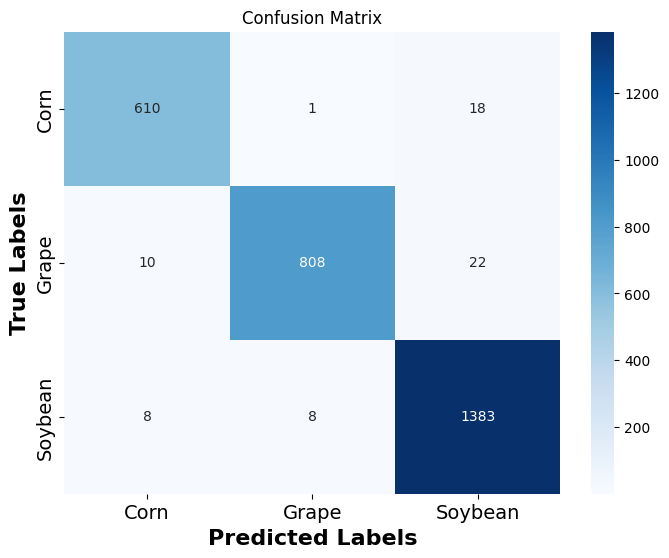

Classification Report:
              precision    recall  f1-score   support

        Corn       0.97      0.97      0.97       629
       Grape       0.99      0.96      0.98       840
     Soybean       0.97      0.99      0.98      1399

    accuracy                           0.98      2868
   macro avg       0.98      0.97      0.98      2868
weighted avg       0.98      0.98      0.98      2868



In [ ]:
# @title results
predictions, true_labels = evaluate_model_with_progress(multicrop_model, multicrop_test_loader, device)

# Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

# Display the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=multicrop_train_dataset.classes, yticklabels=multicrop_train_dataset.classes)
plt.xlabel('Predicted Labels',fontsize = 16,fontweight = 'bold')
plt.ylabel('True Labels',fontsize = 16,fontweight = 'bold')
plt.title('Confusion Matrix',fontsize = 18,fontweight = 'bold')
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.title('Confusion Matrix')
plt.show()

# Generate the classification report
class_report = classification_report(true_labels, predictions, target_names= multicrop_train_dataset.classes)
print("Classification Report:")
print(class_report)

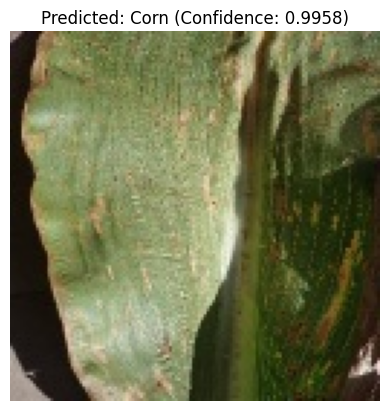

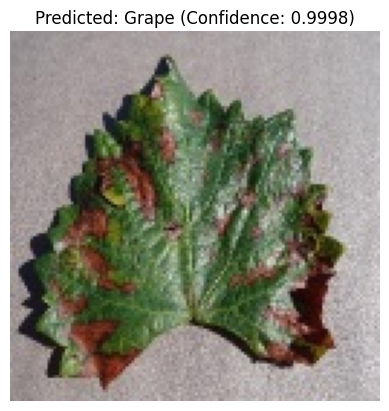

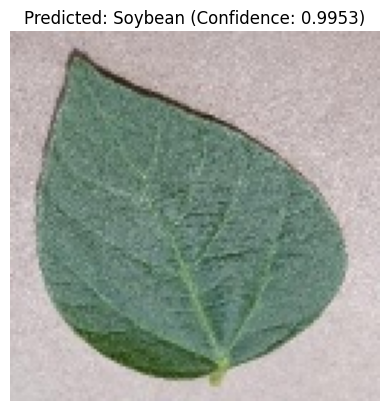

In [ ]:
# @title  prediction
# Example usage
image_paths = [
'/content/multicrop_dataset/test/Corn/00120a18-ff90-46e4-92fb-2b7a10345bd3___RS_GLSp 9357.JPG',
"/content/multicrop_dataset/test/Grape/011bb69d-fb9c-4fb9-b8cc-031e91270ec2___FAM_B.Msls 4288.JPG",
"/content/multicrop_dataset/test/Soybean/02939fee-0408-46de-81c7-e0ecf75fb9f5___RS_HL 4664.JPG"

]
class_names = multicrop_train_dataset.classes  # Replace with your actual class names

for image_path in image_paths:
  predicted_class, confidence = predict_single_image(multicrop_model, image_path, device, class_names)



In [ ]:
# @title Performance metrics
predictions, true_labels = evaluate_model_with_progress(multicrop_model, multicrop_test_loader, device)

# Print metrics and plot confusion matrix
print_metrics(true_labels,predictions,multicrop_train_dataset.classes)

Evaluating: 100%|██████████| 90/90 [00:05<00:00, 15.94batch/s]


Performance Metrics:
--------------------
Accuracy       : 0.9766
Precision      : 0.9774
Recall         : 0.9734
ROC-AUC Score  : 0.9801
Specificity    : 0.9868
--------------------


# Multi Disease classification


In [ ]:
# @title Corn dataset
import splitfolders

# Define the path to your dataset and the destination for the split dataset
input_folder = '/content/drive/MyDrive/Hridaynath-4/keras_format_dataset/Corn'
output_folder = '/content/corn_dataset'


# Split the dataset (66% train, 14% validation, 20% test)
splitfolders.ratio(input_folder, output=output_folder, seed=1337, ratio=(0.66, 0.14, 0.20))

print(f"Dataset has been split and saved in {output_folder}")


Copying files: 4394 files [00:52, 84.31 files/s] 

Dataset has been split and saved in /content/corn_dataset


In [ ]:
# Specify your folder path
folder_path ='/content/corn_dataset'
print_dir_structure_with_lines(folder_path)

📁 corn_dataset (Files: 0)
├── 📁 val (Files: 0)
├── ├── 📁 Corn__common_rust (Files: 154)
├── ├── 📁 Corn__gray_leaf_spot (Files: 153)
├── ├── 📁 Corn__healthy (Files: 154)
├── └── 📁 Corn__northern_leaf_blight (Files: 154)
├── 📁 test (Files: 0)
├── ├── 📁 Corn__common_rust (Files: 220)
├── ├── 📁 Corn__gray_leaf_spot (Files: 219)
├── ├── 📁 Corn__healthy (Files: 220)
├── └── 📁 Corn__northern_leaf_blight (Files: 220)
└── 📁 train (Files: 0)
└── ├── 📁 Corn__common_rust (Files: 726)
└── ├── 📁 Corn__gray_leaf_spot (Files: 722)
└── ├── 📁 Corn__healthy (Files: 726)
└── └── 📁 Corn__northern_leaf_blight (Files: 726)

Total size of '/content/corn_dataset': 37.17 MB


In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from collections import Counter
import pandas as pd

# Define common batch size and target size
batch_size = 32
target_size = (128, 128)

# Define the data augmentation for training
corn_train_transforms = transforms.Compose([
    transforms.Resize(target_size),  # Resize images to the target size
    transforms.RandomRotation(40),  # Random rotations between 0-40 degrees
    transforms.RandomHorizontalFlip(),  # Random horizontal flip
    transforms.RandomAffine(degrees=0, shear=0.2),  # Random shear transformations
    transforms.RandomResizedCrop(target_size),  # Random zoom
    transforms.RandomHorizontalFlip(),  # Horizontal flip
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Define the data preprocessing for validation and test (no augmentation)
corn_val_test_transforms = transforms.Compose([
    transforms.Resize(target_size),  # Resize images to the target size
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Set up the directories for training, validation, and testing
corn_train_dir = 'corn_dataset/train'
corn_val_dir = 'corn_dataset/val'
corn_test_dir = 'corn_dataset/test'

# Load the datasets
corn_train_dataset = datasets.ImageFolder(
    root=corn_train_dir,
    transform=corn_train_transforms
)

corn_val_dataset = datasets.ImageFolder(
    root=corn_val_dir,
    transform=corn_val_test_transforms
)

corn_test_dataset = datasets.ImageFolder(
    root=corn_test_dir,
    transform=corn_val_test_transforms
)

# Create data loaders
corn_train_loader = DataLoader(
    dataset=corn_train_dataset,
    batch_size=batch_size,
    shuffle=True  # Shuffle the training data
)

corn_val_loader = DataLoader(
    dataset=corn_val_dataset,
    batch_size=batch_size,
    shuffle=False  # No need to shuffle validation data
)

corn_test_loader = DataLoader(
    dataset=corn_test_dataset,
    batch_size=batch_size,
    shuffle=False  # No need to shuffle test data
)


# Function to print dataset summary
def print_loader_summary(dataset, name):
    # Count the number of samples per class
    class_counts = Counter([dataset.targets[i] for i in range(len(dataset))])
    class_labels = dataset.classes
    total_samples = len(dataset)
    class_distribution = {class_labels[i]: class_counts[i] for i in range(len(class_labels))}

    print(f"Summary for {name} Dataset:")
    print(f" - Number of classes: {len(class_labels)}")
    print(f" - Class labels: {class_labels}")
    print(f" - Total samples: {total_samples}")

    # Print class distribution
    print(f" - Class distribution:")
    for label, count in class_distribution.items():
        print(f"   {label}: {count}")
    print()

# Print summary for training loader
print_loader_summary(corn_train_dataset, "Training")

# Print summary for validation loader
print_loader_summary(corn_val_dataset, "Validation")

# Print summary for test loader
print_loader_summary(corn_test_dataset, "Test")


Summary for Training Dataset:
 - Number of classes: 4
 - Class labels: ['Corn__common_rust', 'Corn__gray_leaf_spot', 'Corn__healthy', 'Corn__northern_leaf_blight']
 - Total samples: 2900
 - Class distribution:
   Corn__common_rust: 726
   Corn__gray_leaf_spot: 722
   Corn__healthy: 726
   Corn__northern_leaf_blight: 726

Summary for Validation Dataset:
 - Number of classes: 4
 - Class labels: ['Corn__common_rust', 'Corn__gray_leaf_spot', 'Corn__healthy', 'Corn__northern_leaf_blight']
 - Total samples: 615
 - Class distribution:
   Corn__common_rust: 154
   Corn__gray_leaf_spot: 153
   Corn__healthy: 154
   Corn__northern_leaf_blight: 154

Summary for Test Dataset:
 - Number of classes: 4
 - Class labels: ['Corn__common_rust', 'Corn__gray_leaf_spot', 'Corn__healthy', 'Corn__northern_leaf_blight']
 - Total samples: 879
 - Class distribution:
   Corn__common_rust: 220
   Corn__gray_leaf_spot: 219
   Corn__healthy: 220
   Corn__northern_leaf_blight: 220



In [ ]:
learning_rate = 1e-3
num_classes = len(corn_train_dataset.classes)  # Adjust as per dataset
device = 'cuda' if torch.cuda.is_available() else 'cpu'


# Model, loss, optimizer, and scaler for mixed precision
corn_model = PyramidCNN(num_classes=num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(corn_model.parameters(), lr=learning_rate)
scaler = GradScaler()


# Print model summary
summary(corn_model, input_size=(3, 128, 128), device=device)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           9,408
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]           4,096
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]          16,384
      BatchNorm2d-12          [-1, 256, 32, 32]             512
           Conv2d-13          [-1, 256, 32, 32]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
# @title training

train_model(
    corn_model, corn_train_loader, corn_val_loader, criterion, optimizer, scaler,
    device, epochs=5, checkpoint_path="/content/drive/MyDrive/Hridaynath-4/corn_model_checkpoint.pth"
)


Epoch 1/5 - Training: 100%|██████████| 91/91 [00:15<00:00,  5.77it/s, Loss=20.9, Accuracy=37]


Epoch 1/5, Training Loss: 20.9228, Training Accuracy: 36.97%


Epoch 1/5 - Validation: 100%|██████████| 20/20 [00:01<00:00, 17.77it/s, Loss=1.12]


Validation Loss: 1.0602, Validation Accuracy: 44.23%
Best model saved at epoch 1 with validation loss: 1.0602


Epoch 2/5 - Training: 100%|██████████| 91/91 [00:16<00:00,  5.66it/s, Loss=0.949, Accuracy=57.7]


Epoch 2/5, Training Loss: 0.9492, Training Accuracy: 57.72%


Epoch 2/5 - Validation: 100%|██████████| 20/20 [00:01<00:00, 18.72it/s, Loss=0.632]


Validation Loss: 0.6009, Validation Accuracy: 72.03%
Best model saved at epoch 2 with validation loss: 0.6009


Epoch 3/5 - Training: 100%|██████████| 91/91 [00:16<00:00,  5.65it/s, Loss=0.649, Accuracy=72.1]


Epoch 3/5, Training Loss: 0.6494, Training Accuracy: 72.07%


Epoch 3/5 - Validation: 100%|██████████| 20/20 [00:01<00:00, 15.64it/s, Loss=0.469]


Validation Loss: 0.4451, Validation Accuracy: 79.84%
Best model saved at epoch 3 with validation loss: 0.4451


Epoch 4/5 - Training: 100%|██████████| 91/91 [00:16<00:00,  5.68it/s, Loss=0.519, Accuracy=80.3]


Epoch 4/5, Training Loss: 0.5192, Training Accuracy: 80.28%


Epoch 4/5 - Validation: 100%|██████████| 20/20 [00:01<00:00, 18.88it/s, Loss=0.355]


Validation Loss: 0.3368, Validation Accuracy: 86.99%
Best model saved at epoch 4 with validation loss: 0.3368


Epoch 5/5 - Training: 100%|██████████| 91/91 [00:15<00:00,  5.69it/s, Loss=0.558, Accuracy=83.3]


Epoch 5/5, Training Loss: 0.5579, Training Accuracy: 83.34%


Epoch 5/5 - Validation: 100%|██████████| 20/20 [00:01<00:00, 19.15it/s, Loss=0.292]


Validation Loss: 0.2774, Validation Accuracy: 88.78%
Best model saved at epoch 5 with validation loss: 0.2774


Evaluating: 100%|██████████| 20/20 [00:01<00:00, 15.27batch/s]


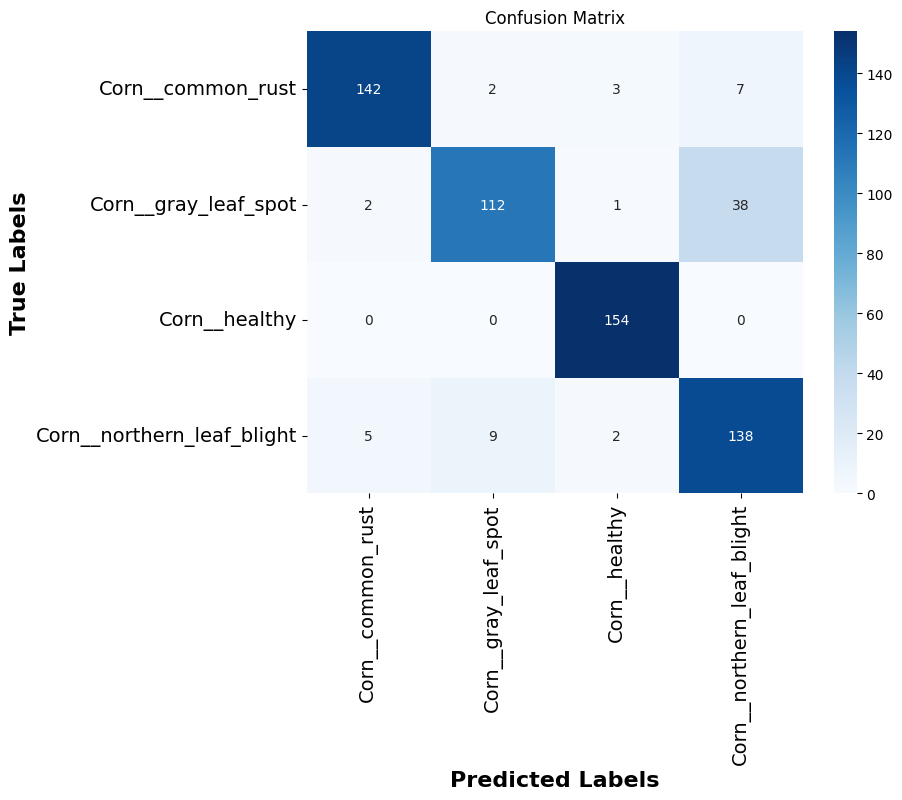

Classification Report:
                            precision    recall  f1-score   support

         Corn__common_rust       0.95      0.92      0.94       154
      Corn__gray_leaf_spot       0.91      0.73      0.81       153
             Corn__healthy       0.96      1.00      0.98       154
Corn__northern_leaf_blight       0.75      0.90      0.82       154

                  accuracy                           0.89       615
                 macro avg       0.90      0.89      0.89       615
              weighted avg       0.90      0.89      0.89       615



In [ ]:
# @title results
predictions, true_labels = evaluate_model_with_progress(corn_model, corn_val_loader, device)

# Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

# Display the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=corn_train_dataset.classes, yticklabels=corn_train_dataset.classes)
plt.xlabel('Predicted Labels',fontsize = 16,fontweight = 'bold')
plt.ylabel('True Labels',fontsize = 16,fontweight = 'bold')
plt.title('Confusion Matrix',fontsize = 18,fontweight = 'bold')
plt.xticks(fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.title('Confusion Matrix')
plt.show()

# Generate the classification report
class_report = classification_report(true_labels, predictions, target_names= corn_train_dataset.classes)
print("Classification Report:")
print(class_report)


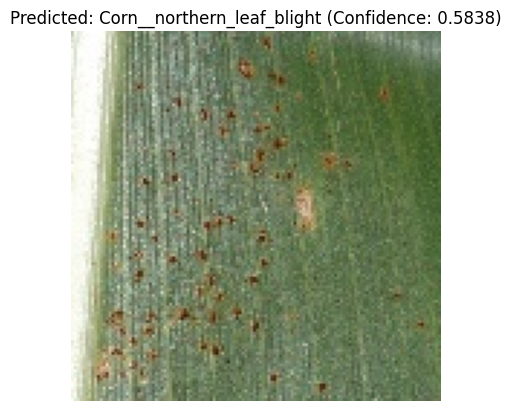

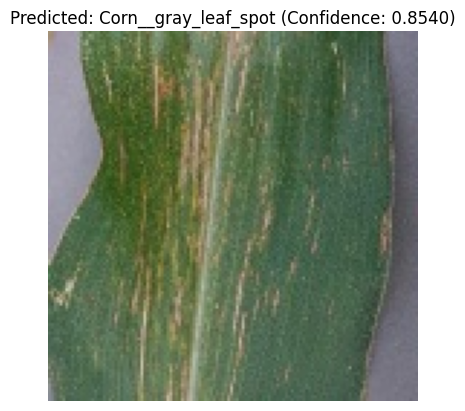

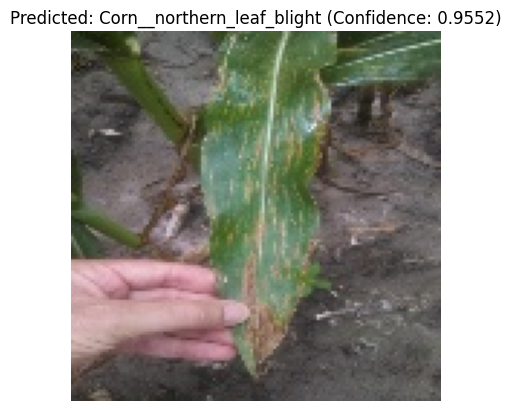

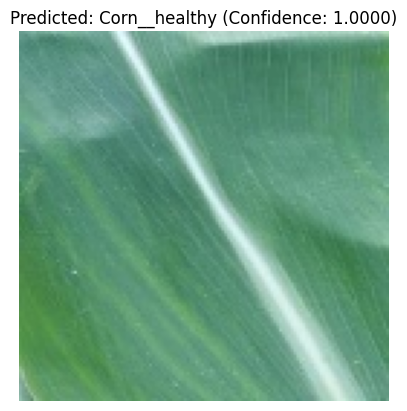

In [ ]:
# @title  prediction
# Example usage
image_paths = [
'/content/corn_dataset/test/Corn__common_rust/Corn rust leaf (19).jpg',
"/content/corn_dataset/test/Corn__gray_leaf_spot/07f54257-0ec8-4bce-991f-90d46646d4f8___RS_GLSp 4378 copy 2.jpg",
"/content/corn_dataset/test/Corn__northern_leaf_blight/Corn leaf blight (124).jpg",
"/content/corn_dataset/test/Corn__healthy/image (1014).jpg"


]
class_names = corn_train_dataset.classes  # Replace with your actual class names

for image_path in image_paths:
  predicted_class, confidence = predict_single_image(corn_model, image_path, device, class_names)



In [ ]:
# @title Performance metrics
predictions, true_labels = evaluate_model_with_progress(corn_model, corn_test_loader, device)

# Print metrics and plot confusion matrix
print_metrics(true_labels,predictions,corn_train_dataset.classes)

Evaluating: 100%|██████████| 28/28 [00:02<00:00, 12.65batch/s]


Performance Metrics:
--------------------
Accuracy       : 0.8942
Precision      : 0.9037
Recall         : 0.8940
ROC-AUC Score  : 0.9294
Specificity    : 0.9647
--------------------


In [ ]:
# @title Grape dataset
import splitfolders

# Define the path to your dataset and the destination for the split dataset
input_folder = '/content/drive/MyDrive/Hridaynath-4/keras_format_dataset/Grape'
output_folder = '/content/grape_dataset'


# Split the dataset (66% train, 14% validation, 20% test)
splitfolders.ratio(input_folder, output=output_folder, seed=1337, ratio=(0.66, 0.14, 0.20))

print(f"Dataset has been split and saved in {output_folder}")


Copying files: 4200 files [00:45, 91.95 files/s] 

Dataset has been split and saved in /content/grape_dataset


In [ ]:
# Specify your folder path
folder_path ='/content/grape_dataset'
print_dir_structure_with_lines(folder_path)

📁 grape_dataset (Files: 0)
├── 📁 train (Files: 0)
├── ├── 📁 Grape__healthy (Files: 660)
├── ├── 📁 Grape__black_measles (Files: 726)
├── ├── 📁 Grape__black_rot (Files: 726)
├── └── 📁 Grape__leaf_blight_(isariopsis_leaf_spot) (Files: 660)
├── 📁 val (Files: 0)
├── ├── 📁 Grape__healthy (Files: 140)
├── ├── 📁 Grape__black_measles (Files: 154)
├── ├── 📁 Grape__black_rot (Files: 154)
├── └── 📁 Grape__leaf_blight_(isariopsis_leaf_spot) (Files: 140)
└── 📁 test (Files: 0)
└── ├── 📁 Grape__healthy (Files: 200)
└── ├── 📁 Grape__black_measles (Files: 220)
└── ├── 📁 Grape__black_rot (Files: 220)
└── └── 📁 Grape__leaf_blight_(isariopsis_leaf_spot) (Files: 200)

Total size of '/content/grape_dataset': 40.06 MB


In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from collections import Counter

# Define common batch size and target size
batch_size = 32
target_size = (128, 128)

# Define the data augmentation for training
grape_train_transforms = transforms.Compose([
    transforms.Resize(target_size),  # Resize images to the target size
    transforms.RandomRotation(40),  # Random rotations between 0-40 degrees
    transforms.RandomHorizontalFlip(),  # Random horizontal flip
    transforms.RandomAffine(degrees=0, shear=0.2),  # Random shear transformations
    transforms.RandomResizedCrop(target_size),  # Random zoom
    transforms.RandomHorizontalFlip(),  # Horizontal flip
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Define the data preprocessing for validation and test (no augmentation)
grape_val_test_transforms = transforms.Compose([
    transforms.Resize(target_size),  # Resize images to the target size
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Set up the directories for training, validation, and testing
grape_train_dir = 'grape_dataset/train'
grape_val_dir = 'grape_dataset/val'
grape_test_dir = 'grape_dataset/test'

# Load the datasets
grape_train_dataset = datasets.ImageFolder(
    root=grape_train_dir,
    transform=grape_train_transforms
)

grape_val_dataset = datasets.ImageFolder(
    root=grape_val_dir,
    transform=grape_val_test_transforms
)

grape_test_dataset = datasets.ImageFolder(
    root=grape_test_dir,
    transform=grape_val_test_transforms
)

# Create data loaders
grape_train_loader = DataLoader(
    dataset=grape_train_dataset,
    batch_size=batch_size,
    shuffle=True  # Shuffle the training data
)

grape_val_loader = DataLoader(
    dataset=grape_val_dataset,
    batch_size=batch_size,
    shuffle=False  # No need to shuffle validation data
)

grape_test_loader = DataLoader(
    dataset=grape_test_dataset,
    batch_size=batch_size,
    shuffle=False  # No need to shuffle test data
)

# Function to print dataset summary
def print_loader_summary(dataset, name):
    # Count the number of samples per class
    class_counts = Counter([dataset.targets[i] for i in range(len(dataset))])
    class_labels = dataset.classes
    total_samples = len(dataset)
    class_distribution = {class_labels[i]: class_counts[i] for i in range(len(class_labels))}

    print(f"Summary for {name} Dataset:")
    print(f" - Number of classes: {len(class_labels)}")
    print(f" - Class labels: {class_labels}")
    print(f" - Total samples: {total_samples}")

    # Print class distribution
    print(f" - Class distribution:")
    for label, count in class_distribution.items():
        print(f"   {label}: {count}")
    print()

# Print summary for training loader
print_loader_summary(grape_train_dataset, "Training")

# Print summary for validation loader
print_loader_summary(grape_val_dataset, "Validation")

# Print summary for test loader
print_loader_summary(grape_test_dataset, "Test")


Summary for Training Dataset:
 - Number of classes: 4
 - Class labels: ['Grape__black_measles', 'Grape__black_rot', 'Grape__healthy', 'Grape__leaf_blight_(isariopsis_leaf_spot)']
 - Total samples: 2772
 - Class distribution:
   Grape__black_measles: 726
   Grape__black_rot: 726
   Grape__healthy: 660
   Grape__leaf_blight_(isariopsis_leaf_spot): 660

Summary for Validation Dataset:
 - Number of classes: 4
 - Class labels: ['Grape__black_measles', 'Grape__black_rot', 'Grape__healthy', 'Grape__leaf_blight_(isariopsis_leaf_spot)']
 - Total samples: 588
 - Class distribution:
   Grape__black_measles: 154
   Grape__black_rot: 154
   Grape__healthy: 140
   Grape__leaf_blight_(isariopsis_leaf_spot): 140

Summary for Test Dataset:
 - Number of classes: 4
 - Class labels: ['Grape__black_measles', 'Grape__black_rot', 'Grape__healthy', 'Grape__leaf_blight_(isariopsis_leaf_spot)']
 - Total samples: 840
 - Class distribution:
   Grape__black_measles: 220
   Grape__black_rot: 220
   Grape__healthy: 

In [ ]:
learning_rate = 1e-3
num_classes = len(grape_train_dataset.classes)  # Adjust as per dataset
device = 'cuda' if torch.cuda.is_available() else 'cpu'


# Model, loss, optimizer, and scaler for mixed precision
grape_model = PyramidCNN(num_classes=num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(grape_model.parameters(), lr=learning_rate)
scaler = GradScaler()


# Print model summary
summary(grape_model, input_size=(3, 128, 128), device=device)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           9,408
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]           4,096
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]          16,384
      BatchNorm2d-12          [-1, 256, 32, 32]             512
           Conv2d-13          [-1, 256, 32, 32]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
# @title training

train_model(
    grape_model, grape_train_loader, grape_val_loader, criterion, optimizer, scaler,
    device, epochs=5, checkpoint_path="/content/drive/MyDrive/Hridaynath-4/grape_model_checkpoint.pth"
)


Epoch 1/5 - Training: 100%|██████████| 87/87 [00:17<00:00,  4.89it/s, Loss=23.5, Accuracy=50.5]


Epoch 1/5, Training Loss: 23.5091, Training Accuracy: 50.54%


Epoch 1/5 - Validation: 100%|██████████| 19/19 [00:01<00:00, 18.41it/s, Loss=0.611]


Validation Loss: 0.6106, Validation Accuracy: 81.12%
Best model saved at epoch 1 with validation loss: 0.6106


Epoch 2/5 - Training: 100%|██████████| 87/87 [00:16<00:00,  5.38it/s, Loss=0.712, Accuracy=77.1]


Epoch 2/5, Training Loss: 0.7115, Training Accuracy: 77.09%


Epoch 2/5 - Validation: 100%|██████████| 19/19 [00:01<00:00, 11.00it/s, Loss=0.396]


Validation Loss: 0.3963, Validation Accuracy: 85.03%
Best model saved at epoch 2 with validation loss: 0.3963


Epoch 3/5 - Training: 100%|██████████| 87/87 [00:25<00:00,  3.37it/s, Loss=0.446, Accuracy=81.5]


Epoch 3/5, Training Loss: 0.4462, Training Accuracy: 81.46%


Epoch 3/5 - Validation: 100%|██████████| 19/19 [00:01<00:00, 12.02it/s, Loss=0.297]


Validation Loss: 0.2816, Validation Accuracy: 91.67%
Best model saved at epoch 3 with validation loss: 0.2816


Epoch 4/5 - Training: 100%|██████████| 87/87 [00:15<00:00,  5.71it/s, Loss=0.367, Accuracy=85.7]


Epoch 4/5, Training Loss: 0.3671, Training Accuracy: 85.68%


Epoch 4/5 - Validation: 100%|██████████| 19/19 [00:01<00:00, 18.82it/s, Loss=0.218]


Validation Loss: 0.2179, Validation Accuracy: 92.18%
Best model saved at epoch 4 with validation loss: 0.2179


Epoch 5/5 - Training: 100%|██████████| 87/87 [00:15<00:00,  5.73it/s, Loss=0.254, Accuracy=90.9]


Epoch 5/5, Training Loss: 0.2538, Training Accuracy: 90.91%


Epoch 5/5 - Validation: 100%|██████████| 19/19 [00:00<00:00, 19.09it/s, Loss=0.231]

Validation Loss: 0.2187, Validation Accuracy: 93.20%


Evaluating: 100%|██████████| 27/27 [00:02<00:00, 13.40batch/s]


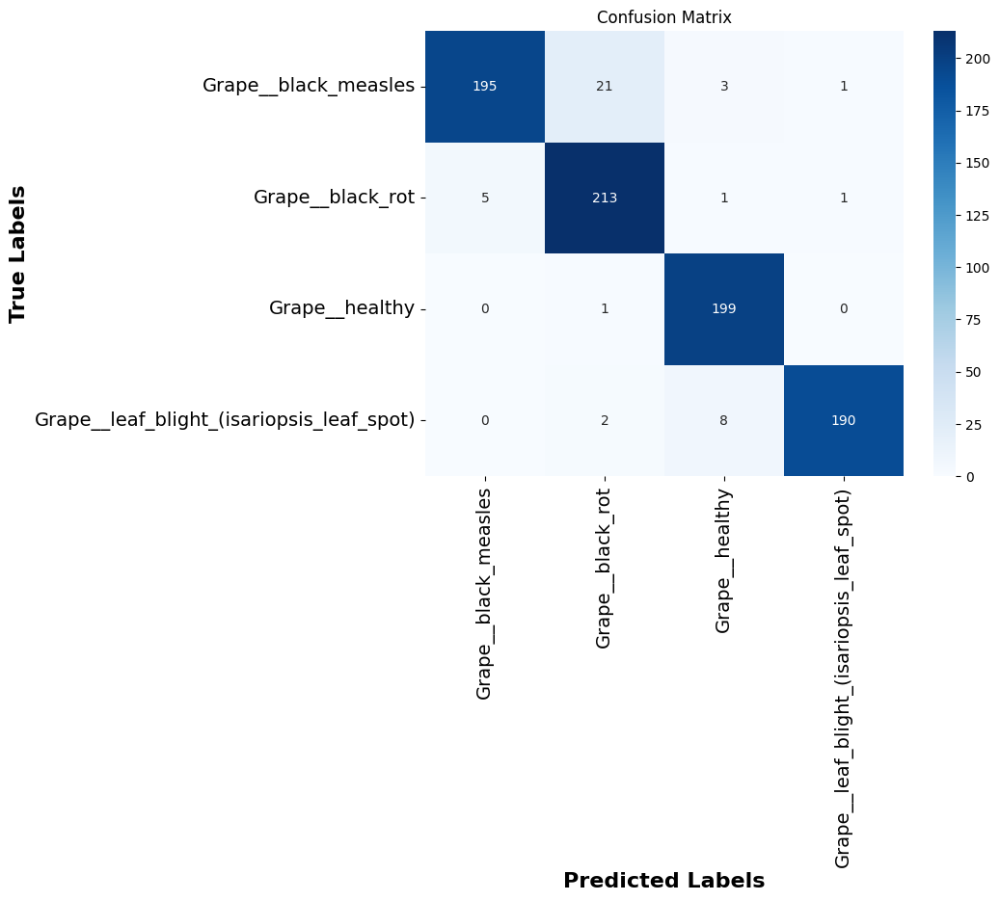

Classification Report:
                                           precision    recall  f1-score   support

                     Grape__black_measles       0.97      0.89      0.93       220
                         Grape__black_rot       0.90      0.97      0.93       220
                           Grape__healthy       0.94      0.99      0.97       200
Grape__leaf_blight_(isariopsis_leaf_spot)       0.99      0.95      0.97       200

                                 accuracy                           0.95       840
                                macro avg       0.95      0.95      0.95       840
                             weighted avg       0.95      0.95      0.95       840



In [ ]:
# @title results
predictions, true_labels = evaluate_model_with_progress(grape_model, grape_test_loader, device)

# Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

# Display the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=grape_train_dataset.classes, yticklabels=grape_train_dataset.classes)
plt.xlabel('Predicted Labels',fontsize = 16,fontweight = 'bold')
plt.ylabel('True Labels',fontsize = 16,fontweight = 'bold')
plt.title('Confusion Matrix',fontsize = 18,fontweight = 'bold')
plt.xticks(fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.title('Confusion Matrix')
plt.show()

# Generate the classification report
class_report = classification_report(true_labels, predictions, target_names= grape_train_dataset.classes)
print("Classification Report:")
print(class_report)


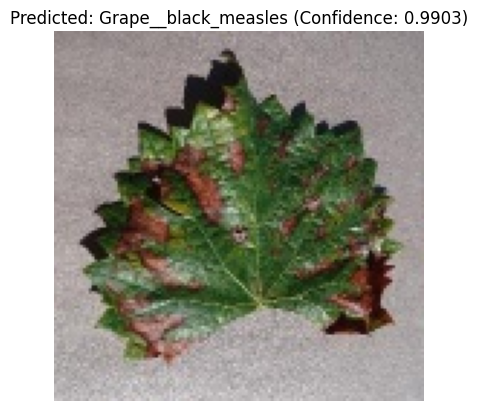

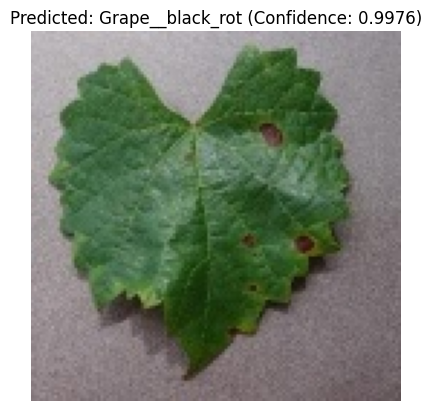

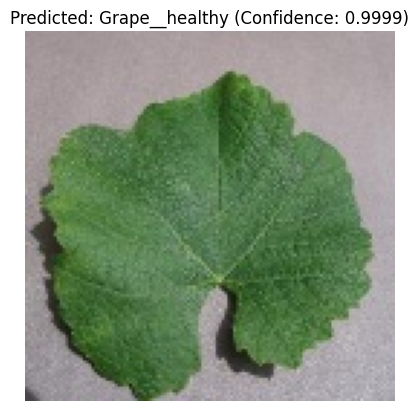

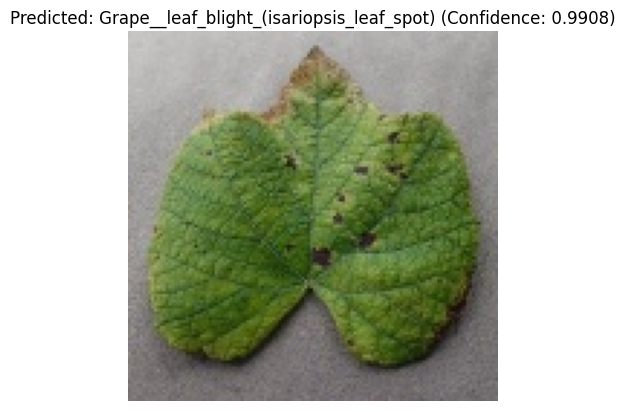

In [ ]:
# @title  prediction
# Example usage
image_paths = [
'/content/grape_dataset/test/Grape__black_measles/04bb8842-a90a-410b-a211-2cfb76735d8b___FAM_B.Msls 4289.JPG',
"/content/grape_dataset/test/Grape__black_rot/Grape_Black_rot1088.jpg",
"/content/grape_dataset/test/Grape__healthy/0ce12a10-c6ff-494e-a927-5ddc809c707a___Mt.N.V_HL 8945.JPG",
"/content/grape_dataset/test/Grape__leaf_blight_(isariopsis_leaf_spot)/04416a29-13a7-49a0-9ab3-f2725ca7b671___FAM_L.Blight 1481.JPG"


]
class_names = grape_train_dataset.classes  # Replace with your actual class names

for image_path in image_paths:
  predicted_class, confidence = predict_single_image(grape_model, image_path, device, class_names)



In [ ]:
# @title Performance metrics
predictions, true_labels = evaluate_model_with_progress(grape_model, grape_test_loader, device)

# Print metrics and plot confusion matrix
print_metrics(true_labels,predictions,grape_train_dataset.classes)

Evaluating: 100%|██████████| 27/27 [00:01<00:00, 15.70batch/s]


Performance Metrics:
--------------------
Accuracy       : 0.9488
Precision      : 0.9516
Recall         : 0.9499
ROC-AUC Score  : 0.9664
Specificity    : 0.9828
--------------------


In [ ]:


# @title Soybean dataset
import splitfolders

# Define the path to your dataset and the destination for the split dataset
input_folder = '/content/drive/MyDrive/Hridaynath-4/keras_format_dataset/Soybean'
output_folder = '/content/Soybean_dataset'


# Split the dataset (66% train, 14% validation, 20% test)
splitfolders.ratio(input_folder, output=output_folder, seed=1337, ratio=(0.66, 0.14, 0.20))

print(f"Dataset has been split and saved in {output_folder}")


Copying files: 7100 files [01:27, 81.20 files/s] 

Dataset has been split and saved in /content/Soybean_dataset


In [ ]:
# Specify your folder path
folder_path ='/content/Soybean_dataset'
print_dir_structure_with_lines(folder_path)

📁 Soybean_dataset (Files: 0)
├── 📁 train (Files: 0)
├── ├── 📁 Soybean__mosaic_virus (Files: 660)
├── ├── 📁 Soybean__bacterial_blight (Files: 660)
├── ├── 📁 Soybean__downy_mildew (Files: 660)
├── ├── 📁 Soybean__healthy (Files: 726)
├── ├── 📁 Soybean__powdery_mildew (Files: 660)
├── ├── 📁 Soybean__rust (Files: 660)
├── └── 📁 Soybean__southern_blight (Files: 660)
├── 📁 val (Files: 0)
├── ├── 📁 Soybean__mosaic_virus (Files: 140)
├── ├── 📁 Soybean__bacterial_blight (Files: 140)
├── ├── 📁 Soybean__downy_mildew (Files: 140)
├── ├── 📁 Soybean__healthy (Files: 154)
├── ├── 📁 Soybean__powdery_mildew (Files: 140)
├── ├── 📁 Soybean__rust (Files: 140)
├── └── 📁 Soybean__southern_blight (Files: 140)
└── 📁 test (Files: 0)
└── ├── 📁 Soybean__mosaic_virus (Files: 200)
└── ├── 📁 Soybean__bacterial_blight (Files: 200)
└── ├── 📁 Soybean__downy_mildew (Files: 200)
└── ├── 📁 Soybean__healthy (Files: 220)
└── ├── 📁 Soybean__powdery_mildew (Files: 200)
└── ├── 📁 Soybean__rust (Files: 200)
└── └── 📁 Soybean__s

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from collections import Counter

# Define common batch size and target size
batch_size = 32
target_size = (128, 128)

# Define the data augmentation for training
soybean_train_transforms = transforms.Compose([
    transforms.Resize(target_size),  # Resize images to the target size
    transforms.RandomRotation(40),  # Random rotations between 0-40 degrees
    transforms.RandomHorizontalFlip(),  # Random horizontal flip
    transforms.RandomAffine(degrees=0, shear=0.2),  # Random shear transformations
    transforms.RandomResizedCrop(target_size),  # Random zoom
    transforms.RandomHorizontalFlip(),  # Horizontal flip
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Define the data preprocessing for validation and test (no augmentation)
soybean_val_test_transforms = transforms.Compose([
    transforms.Resize(target_size),  # Resize images to the target size
    transforms.ToTensor(),  # Convert images to tensors
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])

# Set up the directories for training, validation, and testing
soybean_train_dir = 'Soybean_dataset/train'
soybean_val_dir = 'Soybean_dataset/val'
soybean_test_dir = 'Soybean_dataset/test'

# Load the datasets
soybean_train_dataset = datasets.ImageFolder(
    root=soybean_train_dir,
    transform=grape_train_transforms
)

soybean_val_dataset = datasets.ImageFolder(
    root=soybean_val_dir,
    transform=grape_val_test_transforms
)

soybean_test_dataset = datasets.ImageFolder(
    root=soybean_test_dir,
    transform=grape_val_test_transforms
)

# Create data loaders
soybean_train_loader = DataLoader(
    dataset=soybean_train_dataset,
    batch_size=batch_size,
    shuffle=True  # Shuffle the training data
)

soybean_val_loader = DataLoader(
    dataset=soybean_val_dataset,
    batch_size=batch_size,
    shuffle=False  # No need to shuffle validation data
)

soybean_test_loader = DataLoader(
    dataset=soybean_test_dataset,
    batch_size=batch_size,
    shuffle=False  # No need to shuffle test data
)

# Function to print dataset summary
def print_loader_summary(dataset, name):
    # Count the number of samples per class
    class_counts = Counter([dataset.targets[i] for i in range(len(dataset))])
    class_labels = dataset.classes
    total_samples = len(dataset)
    class_distribution = {class_labels[i]: class_counts[i] for i in range(len(class_labels))}

    print(f"Summary for {name} Dataset:")
    print(f" - Number of classes: {len(class_labels)}")
    print(f" - Class labels: {class_labels}")
    print(f" - Total samples: {total_samples}")

    # Print class distribution
    print(f" - Class distribution:")
    for label, count in class_distribution.items():
        print(f"   {label}: {count}")
    print()

# Print summary for training loader
print_loader_summary(soybean_train_dataset, "Training")

# Print summary for validation loader
print_loader_summary(soybean_val_dataset, "Validation")

# Print summary for test loader
print_loader_summary(soybean_test_dataset, "Test")


Summary for Training Dataset:
 - Number of classes: 7
 - Class labels: ['Soybean__bacterial_blight', 'Soybean__downy_mildew', 'Soybean__healthy', 'Soybean__mosaic_virus', 'Soybean__powdery_mildew', 'Soybean__rust', 'Soybean__southern_blight']
 - Total samples: 4686
 - Class distribution:
   Soybean__bacterial_blight: 660
   Soybean__downy_mildew: 660
   Soybean__healthy: 726
   Soybean__mosaic_virus: 660
   Soybean__powdery_mildew: 660
   Soybean__rust: 660
   Soybean__southern_blight: 660

Summary for Validation Dataset:
 - Number of classes: 7
 - Class labels: ['Soybean__bacterial_blight', 'Soybean__downy_mildew', 'Soybean__healthy', 'Soybean__mosaic_virus', 'Soybean__powdery_mildew', 'Soybean__rust', 'Soybean__southern_blight']
 - Total samples: 994
 - Class distribution:
   Soybean__bacterial_blight: 140
   Soybean__downy_mildew: 140
   Soybean__healthy: 154
   Soybean__mosaic_virus: 140
   Soybean__powdery_mildew: 140
   Soybean__rust: 140
   Soybean__southern_blight: 140

Summary

In [ ]:
learning_rate = 1e-3
num_classes = len(soybean_train_dataset.classes)  # Adjust as per dataset
device = 'cuda' if torch.cuda.is_available() else 'cpu'


# Model, loss, optimizer, and scaler for mixed precision
soybean_model = PyramidCNN(num_classes=num_classes).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(soybean_model.parameters(), lr=learning_rate)
scaler = GradScaler()


# Print model summary
summary(soybean_model, input_size=(3, 128, 128), device=device)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           9,408
       BatchNorm2d-2           [-1, 64, 64, 64]             128
              ReLU-3           [-1, 64, 64, 64]               0
         MaxPool2d-4           [-1, 64, 32, 32]               0
            Conv2d-5           [-1, 64, 32, 32]           4,096
       BatchNorm2d-6           [-1, 64, 32, 32]             128
              ReLU-7           [-1, 64, 32, 32]               0
            Conv2d-8           [-1, 64, 32, 32]          36,864
       BatchNorm2d-9           [-1, 64, 32, 32]             128
             ReLU-10           [-1, 64, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]          16,384
      BatchNorm2d-12          [-1, 256, 32, 32]             512
           Conv2d-13          [-1, 256, 32, 32]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
# @title training

train_model(
    soybean_model, soybean_train_loader, soybean_val_loader, criterion, optimizer, scaler,
    device, epochs=5, checkpoint_path="/content/drive/MyDrive/Hridaynath-4/soybean_model_checkpoint.pth"
)


Epoch 1/5 - Training: 100%|██████████| 147/147 [00:28<00:00,  5.08it/s, Loss=13, Accuracy=30.6]


Epoch 1/5, Training Loss: 12.9836, Training Accuracy: 30.64%


Epoch 1/5 - Validation: 100%|██████████| 32/32 [00:01<00:00, 16.74it/s, Loss=1.32]


Validation Loss: 1.2774, Validation Accuracy: 46.68%
Best model saved at epoch 1 with validation loss: 1.2774


Epoch 2/5 - Training: 100%|██████████| 147/147 [00:45<00:00,  3.22it/s, Loss=1.77, Accuracy=50.9]


Epoch 2/5, Training Loss: 1.7705, Training Accuracy: 50.92%


Epoch 2/5 - Validation: 100%|██████████| 32/32 [00:02<00:00, 15.84it/s, Loss=1.12]


Validation Loss: 1.0898, Validation Accuracy: 52.41%
Best model saved at epoch 2 with validation loss: 1.0898


Epoch 3/5 - Training: 100%|██████████| 147/147 [00:26<00:00,  5.53it/s, Loss=1.04, Accuracy=60.5]


Epoch 3/5, Training Loss: 1.0431, Training Accuracy: 60.48%


Epoch 3/5 - Validation: 100%|██████████| 32/32 [00:02<00:00, 15.18it/s, Loss=0.759]


Validation Loss: 0.7349, Validation Accuracy: 72.84%
Best model saved at epoch 3 with validation loss: 0.7349


Epoch 4/5 - Training: 100%|██████████| 147/147 [00:26<00:00,  5.56it/s, Loss=0.845, Accuracy=68.4]


Epoch 4/5, Training Loss: 0.8446, Training Accuracy: 68.44%


Epoch 4/5 - Validation: 100%|██████████| 32/32 [00:01<00:00, 17.95it/s, Loss=0.597]


Validation Loss: 0.5785, Validation Accuracy: 74.25%
Best model saved at epoch 4 with validation loss: 0.5785


Epoch 5/5 - Training: 100%|██████████| 147/147 [00:35<00:00,  4.11it/s, Loss=0.679, Accuracy=74.7]


Epoch 5/5, Training Loss: 0.6787, Training Accuracy: 74.73%


Epoch 5/5 - Validation: 100%|██████████| 32/32 [00:01<00:00, 17.91it/s, Loss=0.387]


Validation Loss: 0.3753, Validation Accuracy: 89.24%
Best model saved at epoch 5 with validation loss: 0.3753


Evaluating: 100%|██████████| 45/45 [00:03<00:00, 12.73batch/s]


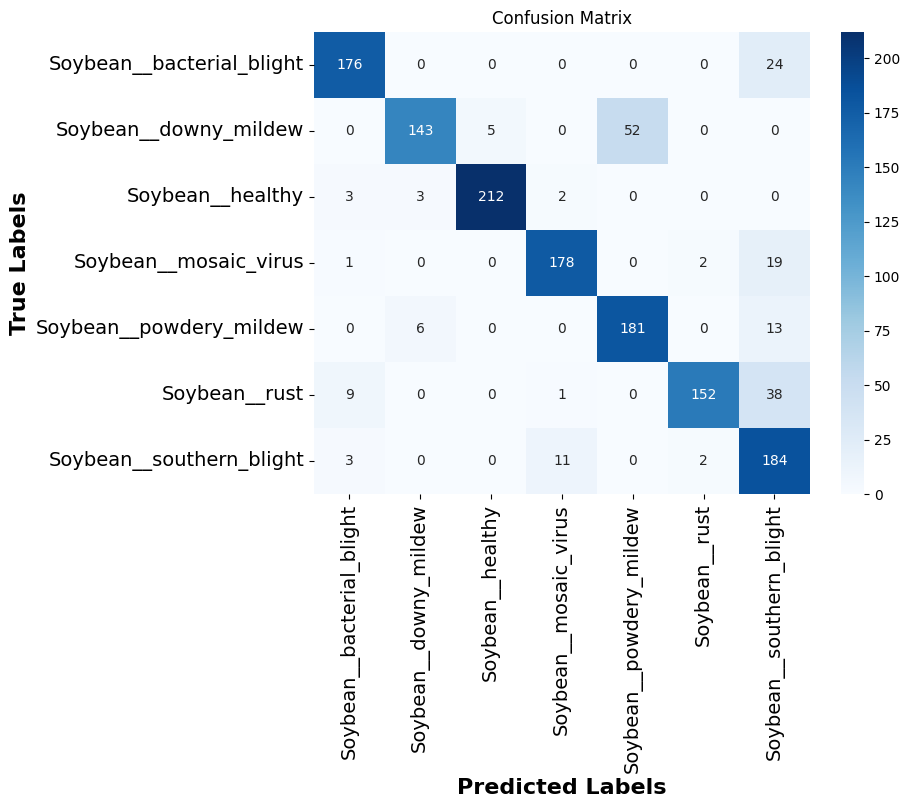

Classification Report:
                           precision    recall  f1-score   support

Soybean__bacterial_blight       0.92      0.88      0.90       200
    Soybean__downy_mildew       0.94      0.71      0.81       200
         Soybean__healthy       0.98      0.96      0.97       220
    Soybean__mosaic_virus       0.93      0.89      0.91       200
  Soybean__powdery_mildew       0.78      0.91      0.84       200
            Soybean__rust       0.97      0.76      0.85       200
 Soybean__southern_blight       0.66      0.92      0.77       200

                 accuracy                           0.86      1420
                macro avg       0.88      0.86      0.86      1420
             weighted avg       0.88      0.86      0.87      1420



In [ ]:
# @title results
predictions, true_labels = evaluate_model_with_progress(soybean_model, soybean_test_loader, device)

# Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

# Display the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=soybean_train_dataset.classes, yticklabels=soybean_train_dataset.classes)
plt.xlabel('Predicted Labels',fontsize = 16,fontweight = 'bold')
plt.ylabel('True Labels',fontsize = 16,fontweight = 'bold')
plt.title('Confusion Matrix',fontsize = 18,fontweight = 'bold')
plt.xticks(fontsize = 14)
plt.yticks(rotation = 0,fontsize = 14)
plt.title('Confusion Matrix')
plt.show()

# Generate the classification report
class_report = classification_report(true_labels, predictions, target_names=soybean_train_dataset.classes)
print("Classification Report:")
print(class_report)


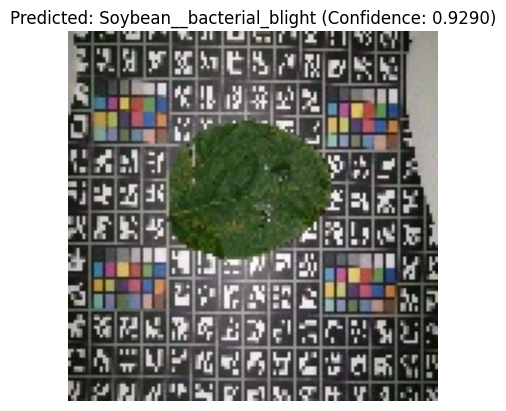

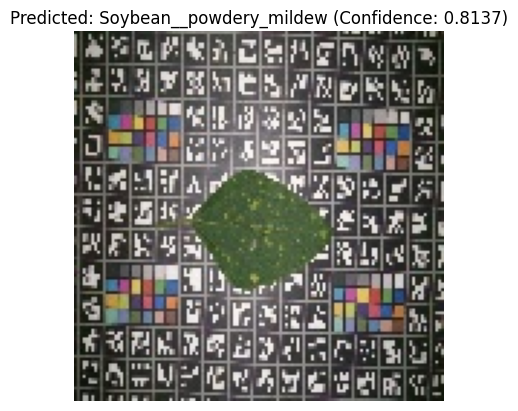

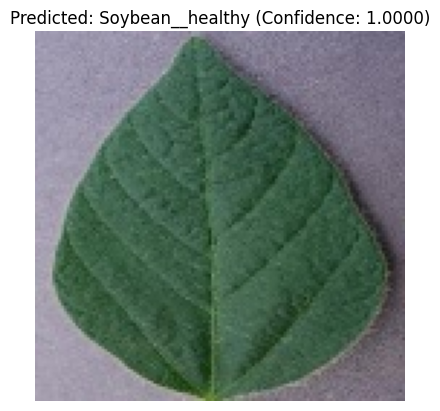

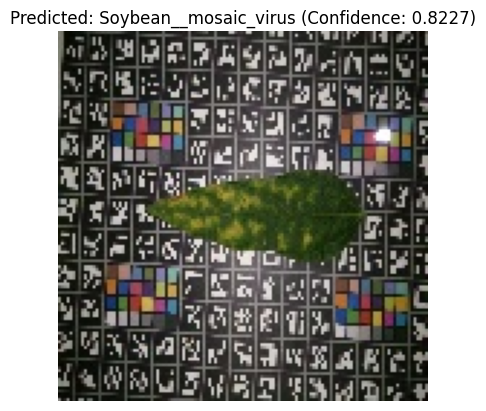

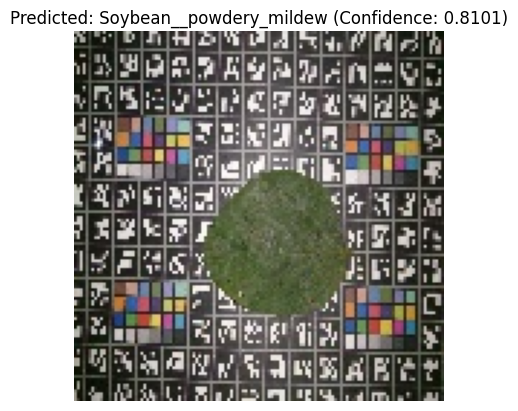

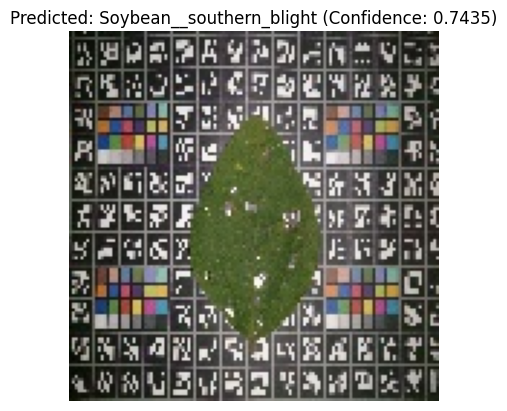

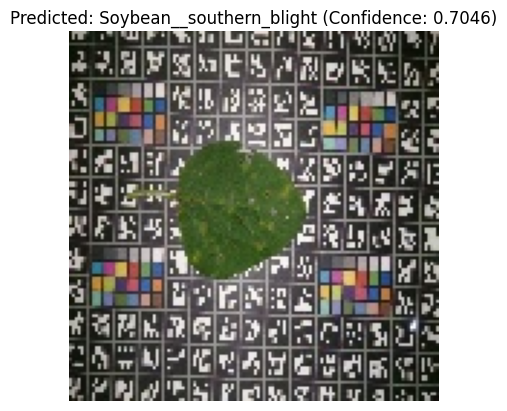

In [ ]:
# @title  prediction
# Example usage
image_paths = [
'/content/Soybean_dataset/test/Soybean__bacterial_blight/DSC_0047.jpg',
"/content/Soybean_dataset/test/Soybean__downy_mildew/DSC_0012.jpg",
"/content/Soybean_dataset/test/Soybean__healthy/00f41aaf-1926-4b9d-9101-0bd4e2a3e332___RS_HL 6282.JPG",
"/content/Soybean_dataset/test/Soybean__mosaic_virus/DSC_0138.jpg",
"/content/Soybean_dataset/test/Soybean__powdery_mildew/DSC_0068.jpg",
"/content/Soybean_dataset/test/Soybean__rust/DSC_0020.jpg",
"/content/Soybean_dataset/test/Soybean__southern_blight/DSC_0034.jpg"

]
class_names = soybean_train_dataset.classes  # Replace with your actual class names

for image_path in image_paths:
  predicted_class, confidence = predict_single_image(soybean_model, image_path, device, class_names)



In [ ]:
# @title Performance metrics
predictions, true_labels = evaluate_model_with_progress(soybean_model, soybean_test_loader, device)

# Print metrics and plot confusion matrix
print_metrics(true_labels,predictions,soybean_train_dataset.classes)

Evaluating: 100%|██████████| 45/45 [00:02<00:00, 15.66batch/s]


Performance Metrics:
--------------------
Accuracy       : 0.8634
Precision      : 0.8821
Recall         : 0.8619
ROC-AUC Score  : 0.9196
Specificity    : 0.9773
--------------------


# Multi Crop - Multi Disease Prediction Pipeline

In [ ]:
# @title Pyramid Convolutional Neural Network with ResNet backbone

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import resnet50
from torch.cuda.amp import GradScaler, autocast
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchsummary import summary
import warnings
warnings.filterwarnings("ignore")

# Pyramid Convolutional Neural Network with ResNet backbone
class PyramidCNN(nn.Module):
    def __init__(self, num_classes, input_size=(3, 128, 128)):
        super(PyramidCNN, self).__init__()
        # Load pre-trained ResNet backbone
        self.backbone = resnet50(pretrained=True)

        # Remove the fully connected layer
        self.backbone = nn.Sequential(*list(self.backbone.children())[:-2])

        # Pyramid pooling layers
        self.pyramid_pooling = nn.ModuleList([
            nn.ModuleList([
                nn.AdaptiveAvgPool2d(output_size),
                nn.AdaptiveMaxPool2d(output_size)
            ])
            for output_size in [1, 2, 4]
        ])

        # Dynamically calculate feature size after pyramid pooling
        dummy_input = torch.zeros(1, *input_size)  # Dummy input tensor
        with torch.no_grad():
            backbone_output = self.backbone(dummy_input)  # Output from backbone
            pooled_features = [backbone_output]
            for pool_layers in self.pyramid_pooling:
                for pool_layer in pool_layers:
                    pooled_features.append(pool_layer(backbone_output))
            self.total_features = sum([f.view(f.size(0), -1).size(1) for f in pooled_features])

        # Fully connected layers
        self.fc1 = nn.Linear(self.total_features, 1024)
        self.fc2 = nn.Linear(1024, num_classes)

    def forward(self, x):
        # Feature extraction with ResNet backbone
        x = self.backbone(x)

        # Pyramid pooling
        pooled_features = [x]
        for pool_layers in self.pyramid_pooling:
            for pool_layer in pool_layers:
                pooled_features.append(pool_layer(x))

        # Concatenate features
        x = torch.cat([f.view(f.size(0), -1) for f in pooled_features], dim=1)

        # Fully connected layers
        x = self.fc1(x)
        x = nn.ReLU()(x)
        x = self.fc2(x)
        return x


In [ ]:
import torch

class Inference:
    def __init__(self, model_class, checkpoint_path,device="cpu", *args, **kwargs):
        """
        Initialize the Inference class.

        Parameters:
        - model_class: The model class to instantiate.
        - checkpoint_path: Path to the checkpoint file.
        - device: Device to load the model onto (default is GPU if available, else CPU).
        - *args, **kwargs: Additional arguments for the model class initialization.
        """
        self.model_class = model_class
        self.checkpoint_path = checkpoint_path
        self.device = device
        self.model = model_class(*args, **kwargs).to(self.device)
        self.optimizer = None
        self.scaler = None
        self.start_epoch = 0
        self.best_val_loss = float('inf')

    def load_checkpoint(self):
        """
        Load the checkpoint and restore the model, optimizer, and scaler states.
        """
        checkpoint = torch.load(self.checkpoint_path, map_location=self.device)
        self.model.load_state_dict(checkpoint["model_state_dict"])

        # Optional: Load optimizer and scaler if needed for further training
        if "optimizer_state_dict" in checkpoint:
            self.optimizer = torch.optim.Adam(self.model.parameters())  # Replace with the correct optimizer
            self.optimizer.load_state_dict(checkpoint["optimizer_state_dict"])

        if "scaler_state_dict" in checkpoint:
            self.scaler = torch.cuda.amp.GradScaler()
            self.scaler.load_state_dict(checkpoint["scaler_state_dict"])

        self.start_epoch = checkpoint.get("epoch", 0)
        self.best_val_loss = checkpoint.get("best_val_loss", float('inf'))

        print(f"Loaded checkpoint from epoch {self.start_epoch} with best validation loss: {self.best_val_loss:.4f}")

    def set_mode(self, mode="eval"):
        """
        Set the model to evaluation or training mode.

        Parameters:
        - mode: 'eval' for evaluation, 'train' for training.
        """
        if mode == "eval":
            self.model.eval()
        elif mode == "train":
            self.model.train()
        else:
            raise ValueError("Invalid mode. Choose 'eval' or 'train'.")

    def get_model(self):
        """
        Retrieve the loaded model.
        """
        return self.model


In [ ]:
class CropPredictionPipeline:
    def __init__(self, pyramid_cnn_class, crop_checkpoint, corn_checkpoint, grape_checkpoint,
                 multicrop_classes, corn_classes, grape_classes, soybean_classes, device, soybean_checkpoint):
        """
        Initialize the CropPredictionPipeline class.

        Args:
            pyramid_cnn_class: The model class to use for all crops.
            crop_checkpoint: Path to the crop classification model checkpoint.
            corn_checkpoint: Path to the corn disease classification model checkpoint.
            grape_checkpoint: Path to the grape classification model checkpoint.
            multicrop_train_dataset: Dataset for crop classification (to get the number of classes).
            corn_train_dataset: Dataset for corn disease classification (to get the number of classes).
            grape_train_dataset: Dataset for grape classification (to get the number of classes).
            device: Device to perform inference (CPU/GPU).
        """
        self.device = device

        # Get number of classes for each dataset
        self.crop_classes = len(multicrop_classes)
        self.corn_classes = len(corn_classes)
        self.grape_classes = len(grape_classes)
        self.soybean_classes = len(soybean_classes)

        # Initialize Inference objects
        self.crop_inference = Inference(pyramid_cnn_class, crop_checkpoint, num_classes=self.crop_classes)
        self.corn_inference = Inference(pyramid_cnn_class, corn_checkpoint, num_classes=self.corn_classes)
        self.grape_inference = Inference(pyramid_cnn_class, grape_checkpoint, num_classes=self.grape_classes)
        self.soybean_inference = Inference(pyramid_cnn_class, soybean_checkpoint, num_classes=self.soybean_classes)
        # Load checkpoints
        self.crop_inference.load_checkpoint()
        self.corn_inference.load_checkpoint()
        self.grape_inference.load_checkpoint()
        self.soybean_inference.load_checkpoint()
        # Set models to evaluation mode
        self.crop_inference.set_mode("eval")
        self.corn_inference.set_mode("eval")
        self.grape_inference.set_mode("eval")
        self.soybean_inference.set_mode("eval")
    def predict(self, image_path):
        """
        Predict the crop type and specific class/disease based on the selected crop model.

        Args:
            image_path: Path to the image to be predicted.

        Returns:
            Final prediction with confidence.
        """
        # Class names for display
        crop_class_names = multicrop_classes
        corn_disease_names = corn_classes
        grape_class_names = grape_classes
        soybean_class_names = soybean_classes
        # Step 1: Predict the crop type
        crop_type, crop_confidence = predict_single_image(
            self.crop_inference.get_model(), image_path, self.device, crop_class_names
        )
        print(f"Predicted Crop Type: {crop_type} (Confidence: {crop_confidence:.4f})")

        # Step 2: Predict finer details based on crop type
        if crop_type == "Corn":
            disease, disease_confidence = predict_single_image(
                self.corn_inference.get_model(), image_path, self.device, corn_disease_names
            )
            print(f"Predicted Corn Disease: {disease} (Confidence: {disease_confidence:.4f})")
            return f"{crop_type} -> {disease}", disease_confidence

        elif crop_type == "Grape":
            specific_class, specific_confidence = predict_single_image(
                self.grape_inference.get_model(), image_path, self.device, grape_class_names
            )
            print(f"Predicted Grape Disease: {specific_class} (Confidence: {specific_confidence:.4f})")
            return f"{crop_type} -> {specific_class}", specific_confidence
        elif crop_type == "Soybean":
            specific_class, specific_confidence = predict_single_image(
                self.soybean_inference.get_model(), image_path, self.device, soybean_class_names
            )
            print(f"Predicted Grape Disease: {specific_class} (Confidence: {specific_confidence:.4f})")
            return f"{crop_type} -> {specific_class}", specific_confidence
        else:
            print("Unknown Crop Type. No further prediction made.")
            return crop_type, crop_confidence


In [ ]:
# Define device
device = "cpu"

multicrop_classes = ['Corn', 'Grape', 'Soybean']
corn_classes = ['Corn__common_rust', 'Corn__gray_leaf_spot', 'Corn__healthy', 'Corn__northern_leaf_blight']
grape_classes = ['Grape__black_measles', 'Grape__black_rot', 'Grape__healthy', 'Grape__leaf_blight']
soybean_classes = ["Soybean__downy_mildew",
    "Soybean__healthy",
    "Soybean__mosaic_virus",
    "Soybean__powdery_mildew",
    "Soybean__rust",
    "Soybean__southern_blight",
    "Soybean__bacterial_blight"]
# Initialize the pipeline
pipeline = CropPredictionPipeline(
    PyramidCNN,
    crop_checkpoint="/content/drive/MyDrive/Hridaynath-4/multicrop_model_checkpoint.pth",
    corn_checkpoint="/content/drive/MyDrive/Hridaynath-4/corn_model_checkpoint.pth",
    grape_checkpoint="/content/drive/MyDrive/Hridaynath-4/grape_model_checkpoint.pth",
    soybean_checkpoint="/content/drive/MyDrive/Hridaynath-4/soybean_model_checkpoint.pth",
    soybean_classes = soybean_classes,
    multicrop_classes = multicrop_classes,
    corn_classes = corn_classes,
    grape_classes = grape_classes,
    device=device
)


Loaded checkpoint from epoch 5 with best validation loss: 0.0893
Loaded checkpoint from epoch 5 with best validation loss: 0.2774
Loaded checkpoint from epoch 4 with best validation loss: 0.2179
Loaded checkpoint from epoch 5 with best validation loss: 0.3753


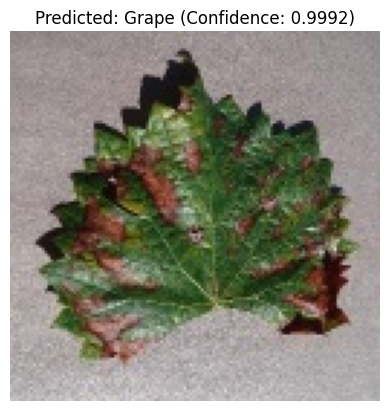

Predicted Crop Type: Grape (Confidence: 0.9992)


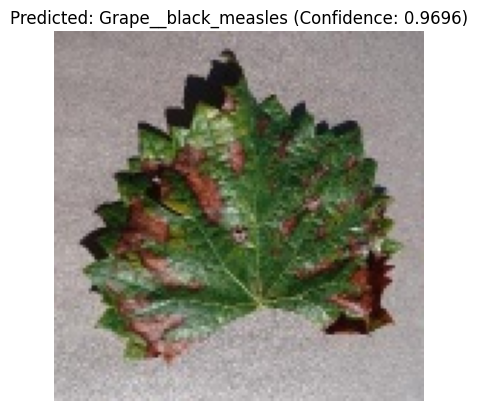

Predicted Grape Disease: Grape__black_measles (Confidence: 0.9696)
Final Prediction: Grape -> Grape__black_measles (Confidence: 0.9696)


In [ ]:
# Perform prediction
image_path = "/content/grape_dataset/test/Grape__black_measles/04bb8842-a90a-410b-a211-2cfb76735d8b___FAM_B.Msls 4289.JPG"
final_prediction, confidence = pipeline.predict(image_path)

print(f"Final Prediction: {final_prediction} (Confidence: {confidence:.4f})")

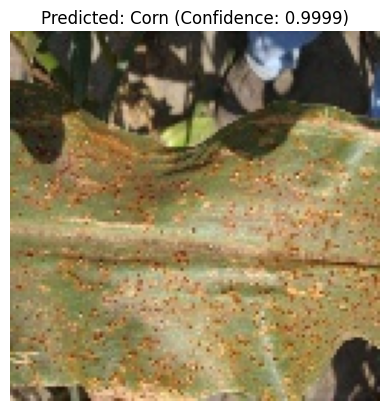

Predicted Crop Type: Corn (Confidence: 0.9999)


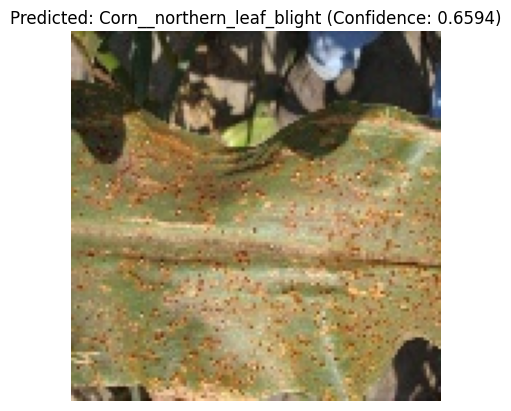

Predicted Corn Disease: Corn__northern_leaf_blight (Confidence: 0.6594)
Final Prediction: Corn -> Corn__northern_leaf_blight (Confidence: 0.6594)


In [ ]:
# Perform prediction
image_path = "/content/corn_dataset/test/Corn__common_rust/Corn rust leaf (100).jpg"
final_prediction, confidence = pipeline.predict(image_path)

print(f"Final Prediction: {final_prediction} (Confidence: {confidence:.4f})")

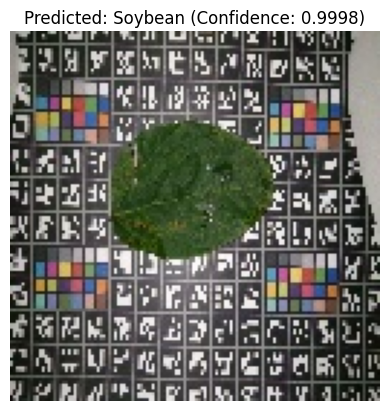

Predicted Crop Type: Soybean (Confidence: 0.9998)


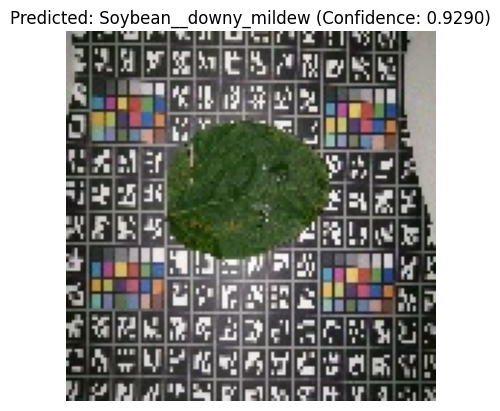

Predicted Grape Disease: Soybean__downy_mildew (Confidence: 0.9290)
Final Prediction: Soybean -> Soybean__downy_mildew (Confidence: 0.9290)


In [ ]:
# Perform prediction
image_path = "/content/Soybean_dataset/test/Soybean__bacterial_blight/DSC_0047.jpg"
final_prediction, confidence = pipeline.predict(image_path)

print(f"Final Prediction: {final_prediction} (Confidence: {confidence:.4f})")